In [1]:
#%% Imports

# Basic Imports 
import numpy as np
import pandas as pd

# Plotting Imports
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from networkx import DiGraph
import networkx as nx
import statistics
from itertools import permutations
from itertools import combinations #no longer being used
from IPython import display

In [2]:
curated = pd.read_csv('curated_gene_disease_associations.tsv', sep = "\t")

In [3]:
threeCol = curated.drop(columns = ['diseaseType', 'DSI', 'DPI', 'diseaseClass', 'diseaseSemanticType', 'score', 'EI', 'YearInitial', 'YearFinal', 'NofPmids', 'NofSnps'])

In [4]:
threeCol['source'] = threeCol['source'].apply(lambda x: set(x[:].split(";")))
threeColsep = pd.DataFrame([(c, tup.geneId, tup.geneSymbol, tup.diseaseId, tup.diseaseName) for tup in threeCol.itertuples() for c in tup.source])
threeColsep = threeColsep.rename(columns= {0: 'source', 1: 'geneId', 2: 'geneSymbol', 3: 'diseaseId', 4: 'diseaseName'})

In [5]:
diseasemappings = pd.read_csv('disease_mappings.tsv', sep = '\t')
diseasemappings

,diseaseId,name,vocabulary,code,vocabularyName
0,C0018923,Hemangiosarcoma,DO,0001816,angiosarcoma
1,C0854893,Angiosarcoma non-metastatic,DO,0001816,angiosarcoma
2,C0033999,Pterygium,DO,0002116,pterygium
3,C0025517,Metabolic Diseases,DO,0014667,disease of metabolism
4,C0155862,Streptococcal pneumonia,DO,0040084,Streptococcus pneumonia
...,...,...,...,...,...
242884,C0279628,Adenocarcinoma Of Esophagus,ORDO,99976,Adenocarcinoma of the esophagus
242885,C0279626,Squamous cell carcinoma of esophagus,ORDO,99977,Squamous cell carcinoma of the esophagus
242886,C0206702,Klatskin Tumor,ORDO,99978,Klatskin tumor
242887,C0007462,Causalgia,ORDO,99994,Complex regional pain syndrome type 2


In [6]:
diseasemappings = diseasemappings.drop(columns = ['vocabularyName'])
diseasemappings = diseasemappings.rename(columns = {'name': 'diseaseName'})
diseasemappings

,diseaseId,diseaseName,vocabulary,code
0,C0018923,Hemangiosarcoma,DO,0001816
1,C0854893,Angiosarcoma non-metastatic,DO,0001816
2,C0033999,Pterygium,DO,0002116
3,C0025517,Metabolic Diseases,DO,0014667
4,C0155862,Streptococcal pneumonia,DO,0040084
...,...,...,...,...
242884,C0279628,Adenocarcinoma Of Esophagus,ORDO,99976
242885,C0279626,Squamous cell carcinoma of esophagus,ORDO,99977
242886,C0206702,Klatskin Tumor,ORDO,99978
242887,C0007462,Causalgia,ORDO,99994


In [7]:
result1 = diseasemappings.merge(threeColsep)
result2 = result1[result1['vocabulary'].map(lambda d: d == 'DO')]
result2['DOID'] = ('DOID:' + (result2['code']))
result2

<ipython-input-7-ecb85bb04ea3>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result2['DOID'] = ('DOID:' + (result2['code']))


,diseaseId,diseaseName,vocabulary,code,source,geneId,geneSymbol,DOID
0,C0018923,Hemangiosarcoma,DO,0001816,CTD_human,285,ANGPT2,DOID:0001816
1,C0018923,Hemangiosarcoma,DO,0001816,CTD_human,595,CCND1,DOID:0001816
2,C0018923,Hemangiosarcoma,DO,0001816,CTD_human,1440,CSF3,DOID:0001816
3,C0018923,Hemangiosarcoma,DO,0001816,CTD_human,1499,CTNNB1,DOID:0001816
4,C0018923,Hemangiosarcoma,DO,0001816,CTD_human,2321,FLT1,DOID:0001816
...,...,...,...,...,...,...,...,...
3230992,C0020615,Hypoglycemia,DO,9993,CTD_human,5465,PPARA,DOID:9993
3230993,C0020615,Hypoglycemia,DO,9993,CTD_human,6648,SOD2,DOID:9993
3230994,C0020615,Hypoglycemia,DO,9993,CTD_human,6927,HNF1A,DOID:9993
3230995,C0020615,Hypoglycemia,DO,9993,CTD_human,7124,TNF,DOID:9993


In [8]:
resultDOID = result2.groupby(by = ['DOID', 'diseaseName', 'source'])['geneId'].apply(lambda x: set(x))
resultDOID = resultDOID.reset_index()
resultDOID

,DOID,diseaseName,source,geneId
0,DOID:0001816,Hemangiosarcoma,CGI,"{5335, 5787, 3845, 3791}"
1,DOID:0001816,Hemangiosarcoma,CTD_human,"{1440, 3265, 4609, 7010, 7424, 3845, 2701, 372..."
2,DOID:0002116,Pterygium,CTD_human,{3440}
3,DOID:0002116,Pterygium,GENOMICS_ENGLAND,{23299}
4,DOID:0014667,Metabolic Diseases,CTD_human,"{196, 1828, 5444, 3630, 2101, 51733, 5468, 140..."
...,...,...,...,...
20005,DOID:998,Eosinophilia-Myalgia Syndrome,CTD_human,"{3123, 3117}"
20006,DOID:999,Eosinophilia,CTD_human,"{2625, 81858, 4615, 5897, 3567, 7097, 7099}"
20007,DOID:999,Eosinophilia,GENOMICS_ENGLAND,{3572}
20008,DOID:9993,Hypoglycemia,CTD_human,"{3553, 775, 5465, 6648, 3630, 6927, 5265, 7124..."


In [9]:
from imp import reload
import ontology
reload(ontology)

<module 'ontology' from '/mnt/ufs18/home-087/f0102402/Arun_REU/ontology.py'>

In [10]:
from ontology import Ontology

In [11]:
disease_ontology = ontology.Ontology()
disease_ontology.load("/mnt/research/compbio/krishnanlab/data/ontologies/doid.obo")

In [12]:
resultDOIDshort = resultDOID.drop(columns = 'diseaseName')
dict_of_sources = dict(iter(resultDOIDshort.groupby('source')))
dict_of_sources['CLINGEN']

,DOID,source,geneId
49,DOID:0050332,CLINGEN,"{2299, 3766}"
78,DOID:0050428,CLINGEN,{362}
103,DOID:0050429,CLINGEN,{9401}
130,DOID:0050437,CLINGEN,{3920}
141,DOID:0050439,CLINGEN,{25861}
...,...,...,...
19658,DOID:9274,CLINGEN,{2639}
19664,DOID:9274,CLINGEN,{10157}
19676,DOID:9278,CLINGEN,{383}
19681,DOID:9280,CLINGEN,{1373}


In [13]:
CLINGEN_dict = dict(zip(dict_of_sources['CLINGEN'].DOID, dict_of_sources['CLINGEN'].geneId))
CTD_human_dict = dict(zip(dict_of_sources['CTD_human'].DOID, dict_of_sources['CTD_human'].geneId))
CGI_dict = dict(zip(dict_of_sources['CGI'].DOID, dict_of_sources['CGI'].geneId))
GENOMICS_ENGLAND_dict = dict(zip(dict_of_sources['GENOMICS_ENGLAND'].DOID, dict_of_sources['GENOMICS_ENGLAND'].geneId))
UNIPROT_dict = dict(zip(dict_of_sources['UNIPROT'].DOID, dict_of_sources['UNIPROT'].geneId))
ORPHANET_dict = dict(zip(dict_of_sources['ORPHANET'].DOID, dict_of_sources['ORPHANET'].geneId))
PSYGENET_dict = dict(zip(dict_of_sources['PSYGENET'].DOID, dict_of_sources['PSYGENET'].geneId))

In [14]:
CLINGEN_prop = disease_ontology.propagate(CLINGEN_dict)
CTD_human_prop = disease_ontology.propagate(CTD_human_dict)
CGI_prop = disease_ontology.propagate(CGI_dict)
GENOMICS_ENGLAND_prop = disease_ontology.propagate(GENOMICS_ENGLAND_dict)
UNIPROT_prop = disease_ontology.propagate(UNIPROT_dict)
ORPHANET_prop = disease_ontology.propagate(ORPHANET_dict)
PSYGENET_prop = disease_ontology.propagate(PSYGENET_dict)

In [15]:
CLINGEN = pd.DataFrame([k for k in CLINGEN_prop.items()], columns=['DOID', 'geneSet'])
CTD_human = pd.DataFrame([k for k in CTD_human_prop.items()], columns=['DOID', 'geneSet'])
CGI = pd.DataFrame([k for k in CGI_prop.items()], columns=['DOID', 'geneSet'])
GENOMICS_ENGLAND = pd.DataFrame([k for k in GENOMICS_ENGLAND_prop.items()], columns=['DOID', 'geneSet'])
ORPHANET = pd.DataFrame([k for k in ORPHANET_prop.items()], columns=['DOID', 'geneSet'])
UNIPROT = pd.DataFrame([k for k in UNIPROT_prop.items()], columns=['DOID', 'geneSet'])
PSYGENET = pd.DataFrame([k for k in PSYGENET_prop.items()], columns=['DOID', 'geneSet'])

In [16]:
CLINGEN['source'] = 'CLINGEN'
CTD_human['source'] = 'CTD_human'
CGI['source'] = 'CGI'
GENOMICS_ENGLAND['source'] = 'GENOMICS_ENGLAND'
ORPHANET['source'] = 'ORPHANET'
UNIPROT['source'] = 'UNIPROT'
PSYGENET['source'] = 'PSYGENET'

In [17]:
propagated = CLINGEN.append(CTD_human).append(CGI).append(GENOMICS_ENGLAND).append(ORPHANET).append(UNIPROT).append(PSYGENET)
propagated

,DOID,geneSet,source
0,DOID:0050332,"{2299, 3766}",CLINGEN
1,DOID:0050155,"{65217, 25861, 64072, 4043, 22926, 4942, 23568...",CLINGEN
2,DOID:4,"{8192, 7168, 1027, 51204, 51206, 3081, 23568, ...",CLINGEN
3,DOID:2742,"{4641, 9381, 3766, 1687, 2299}",CLINGEN
4,DOID:863,"{25861, 2566, 22926, 23568, 785, 9364, 1687, 2...",CLINGEN
...,...,...,...
44,DOID:809,"{4929, 1666, 6531, 4900, 9607, 255239, 5354, 1...",PSYGENET
45,DOID:8645,"{6531, 3557, 3976, 7054, 3569, 1813, 1814, 347...",PSYGENET
46,DOID:9478,"{8864, 6532, 3350, 4988, 50809, 4524, 148014}",PSYGENET
47,DOID:9505,"{6532, 51083, 3084, 4684, 26575, 1813, 1815, 1...",PSYGENET


In [18]:
templist = []
for index, row, in propagated.iterrows():
    if (row['DOID'] in disease_ontology.nodes):
        templist.append(disease_ontology.nodes[row['DOID']]["name"])
    else:
        templist.append("error")
propagated['diseaseName'] = templist
propagated

,DOID,geneSet,source,diseaseName
0,DOID:0050332,"{2299, 3766}",CLINGEN,enlarged vestibular aqueduct
1,DOID:0050155,"{65217, 25861, 64072, 4043, 22926, 4942, 23568...",CLINGEN,sensory system disease
2,DOID:4,"{8192, 7168, 1027, 51204, 51206, 3081, 23568, ...",CLINGEN,disease
3,DOID:2742,"{4641, 9381, 3766, 1687, 2299}",CLINGEN,auditory system disease
4,DOID:863,"{25861, 2566, 22926, 23568, 785, 9364, 1687, 2...",CLINGEN,nervous system disease
...,...,...,...,...
44,DOID:809,"{4929, 1666, 6531, 4900, 9607, 255239, 5354, 1...",PSYGENET,cocaine abuse
45,DOID:8645,"{6531, 3557, 3976, 7054, 3569, 1813, 1814, 347...",PSYGENET,subacute delirium
46,DOID:9478,"{8864, 6532, 3350, 4988, 50809, 4524, 148014}",PSYGENET,postpartum depression
47,DOID:9505,"{6532, 51083, 3084, 4684, 26575, 1813, 1815, 1...",PSYGENET,cannabis abuse


In [19]:
selected = pd.read_csv('selectedDOIDS.csv')
selected = selected.rename(columns = {'dis_doid': 'DOID'})
selected

,DOID,dis_name,numgenes_CLINGEN,numgenes_CGI,numgenes_CTD_human,numgenes_GENOMICS_ENGLAND,numgenes_ORPHANET,numgenes_PSYGENET,numgenes_UNIPROT,numgenes_dir,numgenes_prop,numsource_ge10
0,DOID:162,cancer,32,307,2963,168,247,0,740,128,3574,6
1,DOID:863,nervous system disease,37,47,1657,974,601,0,553,53,2206,6
2,DOID:77,gastrointestinal system disease,5,71,1433,162,76,0,553,12,1987,5
3,DOID:3119,gastrointestinal system cancer,3,76,993,29,17,0,528,6,1463,5
4,DOID:305,carcinoma,2,112,1087,36,36,0,211,166,1310,5
...,...,...,...,...,...,...,...,...,...,...,...,...
72,DOID:1342,congenital hypoplastic anemia,9,0,25,54,20,0,14,32,60,4
73,DOID:1793,pancreatic cancer,0,17,28,2,8,0,15,107,58,3
74,DOID:628,combined T cell and B cell immunodeficiency,1,0,24,28,26,0,16,42,38,4
75,DOID:0110274,autosomal recessive limb-girdle muscular dystr...,0,0,12,23,9,0,20,8,30,3


In [20]:
result = selected.merge(propagated, how = 'inner')
result

,DOID,dis_name,numgenes_CLINGEN,numgenes_CGI,numgenes_CTD_human,numgenes_GENOMICS_ENGLAND,numgenes_ORPHANET,numgenes_PSYGENET,numgenes_UNIPROT,numgenes_dir,numgenes_prop,numsource_ge10,geneSet,source,diseaseName
0,DOID:162,cancer,32,307,2963,168,247,0,740,128,3574,6,"{11200, 5889, 5892, 580, 4292, 6598, 7046, 436...",CLINGEN,cancer
1,DOID:162,cancer,32,307,2963,168,247,0,740,128,3574,6,"{2, 9, 10, 100499467, 8202, 12, 8204, 10004891...",CTD_human,cancer
2,DOID:162,cancer,32,307,2963,168,247,0,740,128,3574,6,"{2048, 1026, 1027, 7172, 1029, 1030, 1031, 171...",CGI,cancer
3,DOID:162,cancer,32,307,2963,168,247,0,740,128,3574,6,"{1027, 1028, 1029, 54790, 4615, 171023, 5649, ...",GENOMICS_ENGLAND,cancer
4,DOID:162,cancer,32,307,2963,168,247,0,740,128,3574,6,"{2048, 4609, 7170, 7171, 1029, 54790, 4615, 71...",ORPHANET,cancer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
398,DOID:0110274,autosomal recessive limb-girdle muscular dystr...,0,0,12,23,9,0,20,8,30,3,"{729920, 29954, 1605, 55624, 60684, 11149, 203...",UNIPROT,autosomal recessive limb-girdle muscular dystr...
399,DOID:0050534,congenital stationary night blindness,0,0,14,11,2,0,10,17,14,3,"{778, 4308, 6295, 60506, 2779, 2784, 9187, 291...",CTD_human,congenital stationary night blindness
400,DOID:0050534,congenital stationary night blindness,0,0,14,11,2,0,10,17,14,3,"{9187, 2916, 60506, 5158, 345193, 778, 440435,...",GENOMICS_ENGLAND,congenital stationary night blindness
401,DOID:0050534,congenital stationary night blindness,0,0,14,11,2,0,10,17,14,3,"{6011, 6295}",ORPHANET,congenital stationary night blindness


In [21]:
# Creating Sets of Sources Based on Disease
a2 = result.groupby(by = ['DOID'])['source'].apply(lambda x: set(x))
a2 = a2.to_frame().reset_index()
a2

,DOID,source
0,DOID:0014667,"{UNIPROT, CLINGEN, GENOMICS_ENGLAND, ORPHANET,..."
1,DOID:0050387,"{UNIPROT, GENOMICS_ENGLAND, ORPHANET, CTD_huma..."
2,DOID:0050534,"{CTD_human, UNIPROT, GENOMICS_ENGLAND, ORPHANET}"
3,DOID:0050700,"{UNIPROT, CLINGEN, GENOMICS_ENGLAND, ORPHANET,..."
4,DOID:0050951,"{UNIPROT, CLINGEN, GENOMICS_ENGLAND, ORPHANET,..."
...,...,...
72,DOID:9256,"{CTD_human, UNIPROT, GENOMICS_ENGLAND, CGI}"
73,DOID:9351,"{CTD_human, UNIPROT, GENOMICS_ENGLAND, ORPHANET}"
74,DOID:936,"{UNIPROT, CLINGEN, GENOMICS_ENGLAND, ORPHANET,..."
75,DOID:9455,"{UNIPROT, CLINGEN, GENOMICS_ENGLAND, ORPHANET,..."


In [22]:
# Creating the Different Possible Combinations of Sources for Each Disease:
from itertools import product
a2['permutations'] = a2['source'].apply(lambda r: list(permutations(r,2)))

# Removing the Diseases that Only Hold One Source:
a3 = a2[a2['permutations'].map(lambda d: len(d)) > 0]
a3

,DOID,source,permutations
0,DOID:0014667,"{UNIPROT, CLINGEN, GENOMICS_ENGLAND, ORPHANET,...","[(UNIPROT, CLINGEN), (UNIPROT, GENOMICS_ENGLAN..."
1,DOID:0050387,"{UNIPROT, GENOMICS_ENGLAND, ORPHANET, CTD_huma...","[(UNIPROT, GENOMICS_ENGLAND), (UNIPROT, ORPHAN..."
2,DOID:0050534,"{CTD_human, UNIPROT, GENOMICS_ENGLAND, ORPHANET}","[(CTD_human, UNIPROT), (CTD_human, GENOMICS_EN..."
3,DOID:0050700,"{UNIPROT, CLINGEN, GENOMICS_ENGLAND, ORPHANET,...","[(UNIPROT, CLINGEN), (UNIPROT, GENOMICS_ENGLAN..."
4,DOID:0050951,"{UNIPROT, CLINGEN, GENOMICS_ENGLAND, ORPHANET,...","[(UNIPROT, CLINGEN), (UNIPROT, GENOMICS_ENGLAN..."
...,...,...,...
72,DOID:9256,"{CTD_human, UNIPROT, GENOMICS_ENGLAND, CGI}","[(CTD_human, UNIPROT), (CTD_human, GENOMICS_EN..."
73,DOID:9351,"{CTD_human, UNIPROT, GENOMICS_ENGLAND, ORPHANET}","[(CTD_human, UNIPROT), (CTD_human, GENOMICS_EN..."
74,DOID:936,"{UNIPROT, CLINGEN, GENOMICS_ENGLAND, ORPHANET,...","[(UNIPROT, CLINGEN), (UNIPROT, GENOMICS_ENGLAN..."
75,DOID:9455,"{UNIPROT, CLINGEN, GENOMICS_ENGLAND, ORPHANET,...","[(UNIPROT, CLINGEN), (UNIPROT, GENOMICS_ENGLAN..."


In [23]:
# Making a Separate Row for Each Combination:
resultGE = pd.DataFrame([(c, tup.DOID) for tup in a3.itertuples() for c in tup.permutations])
resultGE = resultGE.rename(columns={0: 'Combos', 1: 'DOID'})

# Separating the Created Combinations into 2 Columns:
resultGE[['SourceTrain','SourceEval']] = pd.DataFrame(resultGE.Combos.tolist(), index= resultGE.index)

In [24]:
arowList = []
arow2List = []
for index, row in resultGE.iterrows():
    midrow = result.loc[(result['DOID'] == row['DOID']) & (result['source'] == row['SourceTrain'])]
    arowList.append(midrow.iloc[0]['geneSet'])
    
    midrow2 = result.loc[(result['DOID'] == row['DOID']) & (result['source'] == row['SourceEval'])]
    arow2List.append(midrow2.iloc[0]['geneSet'])

In [25]:
resultGE['geneId1'] = arowList
resultGE['geneId2'] = arow2List
resultGE = resultGE.drop(columns = ['Combos'])
resultGE['jaccardIndex'] = np.nan

In [26]:
# Jaccard Similarity Coefficient/Jaccard Index Function:
def jaccard(list1, list2):
    intersection = len(list(set(list1).intersection(list2)))
    union = (len(list1) + len(list2)) - intersection
    return float(intersection) / union

In [27]:
def f(x):
    return jaccard(x['geneId1'], x['geneId2']) 

In [28]:
resultGE['jaccardIndex'] = resultGE.apply(f, axis = 1)
resultGE

,DOID,SourceTrain,SourceEval,geneId1,geneId2,jaccardIndex
0,DOID:0014667,UNIPROT,CLINGEN,"{644096, 1537, 514, 140803, 90624, 3077, 10243...","{51204, 3081, 9997, 374291, 55572, 275, 55065,...",0.201413
1,DOID:0014667,UNIPROT,GENOMICS_ENGLAND,"{644096, 1537, 514, 140803, 90624, 3077, 10243...","{644096, 3073, 3074, 10243, 7172, 3077, 378884...",0.491031
2,DOID:0014667,UNIPROT,ORPHANET,"{644096, 1537, 514, 140803, 90624, 3077, 10243...","{644096, 513, 514, 140803, 10243, 3073, 3074, ...",0.430595
3,DOID:0014667,UNIPROT,CTD_human,"{644096, 1537, 514, 140803, 90624, 3077, 10243...","{2, 10243, 51204, 2053, 2055, 2056, 12, 18, 55...",0.243496
4,DOID:0014667,UNIPROT,PSYGENET,"{644096, 1537, 514, 140803, 90624, 3077, 10243...","{217, 125}",0.000000
...,...,...,...,...,...,...
1753,DOID:9884,GENOMICS_ENGLAND,UNIPROT,"{7169, 7170, 29954, 9987, 1291, 1292, 1293, 47...","{29954, 9987, 7170, 1291, 1292, 1293, 60684, 1...",0.627119
1754,DOID:9884,GENOMICS_ENGLAND,ORPHANET,"{7169, 7170, 29954, 9987, 1291, 1292, 1293, 47...","{7169, 1282, 29954, 9987, 1674, 1291, 1292, 12...",0.478873
1755,DOID:9884,ORPHANET,CTD_human,"{7169, 1282, 29954, 9987, 1674, 1291, 1292, 12...","{7169, 29954, 7170, 1281, 1026, 1291, 1292, 12...",0.375000
1756,DOID:9884,ORPHANET,UNIPROT,"{7169, 1282, 29954, 9987, 1674, 1291, 1292, 12...","{29954, 9987, 7170, 1291, 1292, 1293, 60684, 1...",0.444444


<ipython-input-29-98ba1720c295>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(8,6))


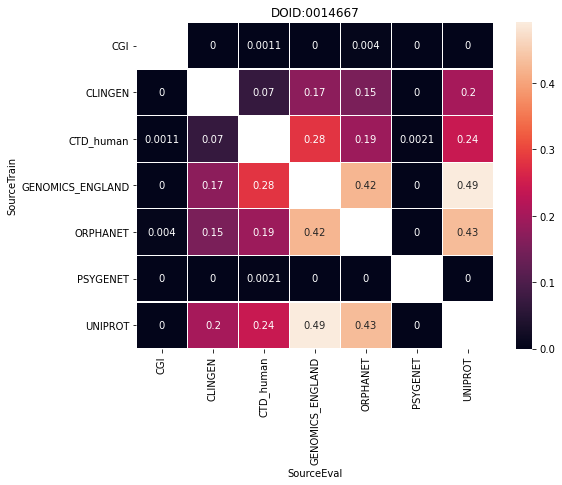

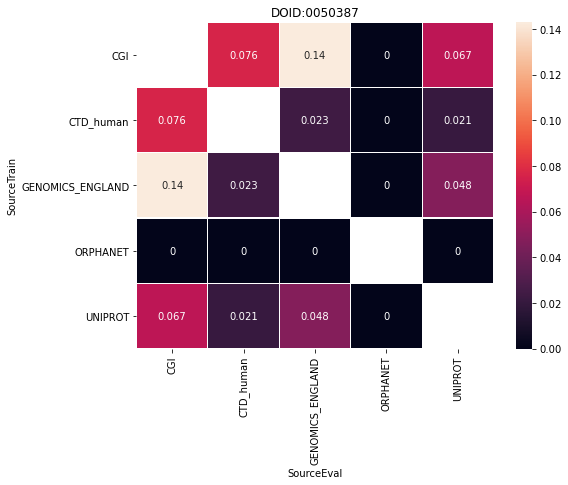

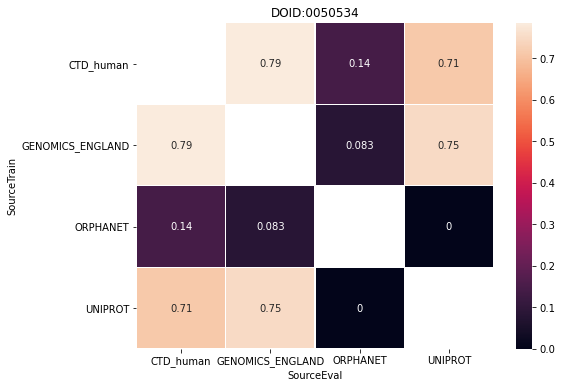

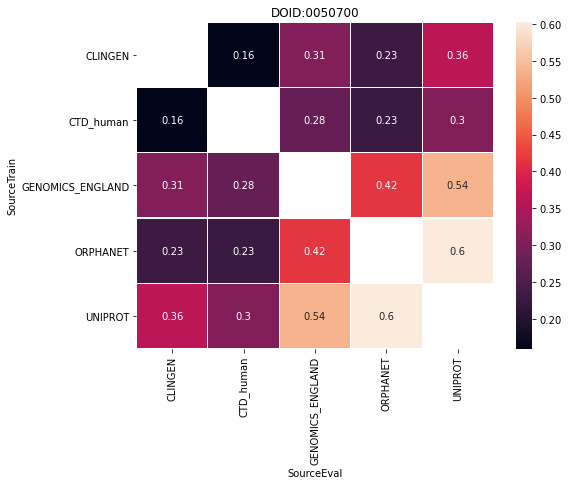

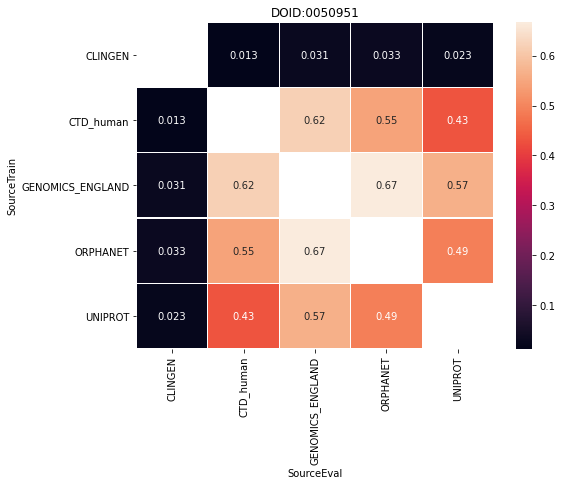

...

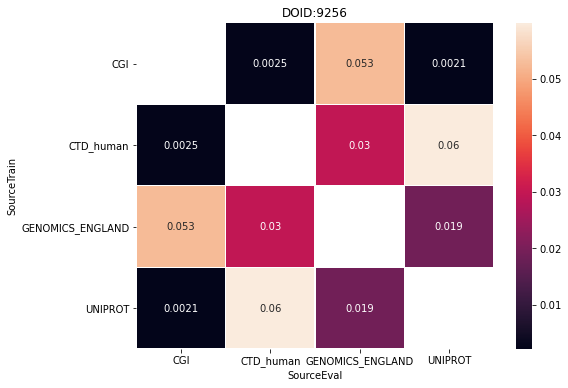

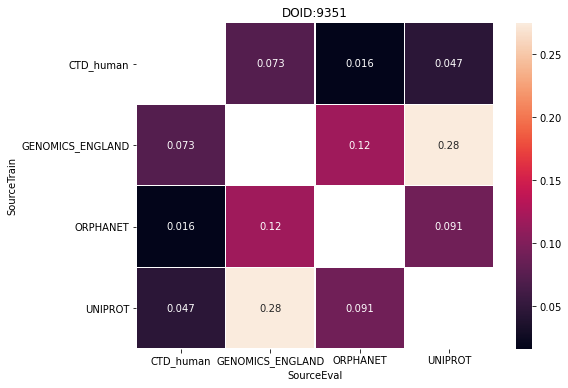

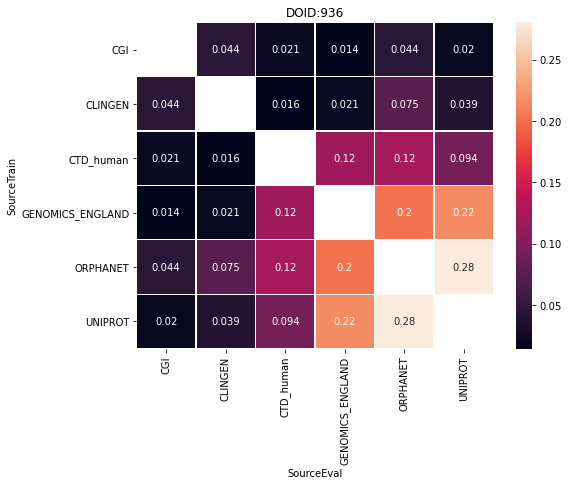

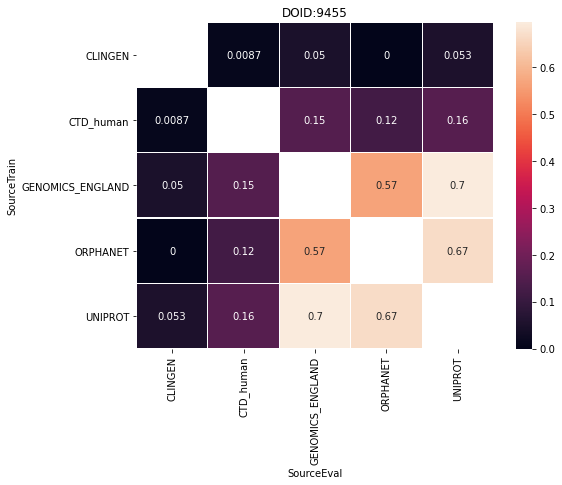

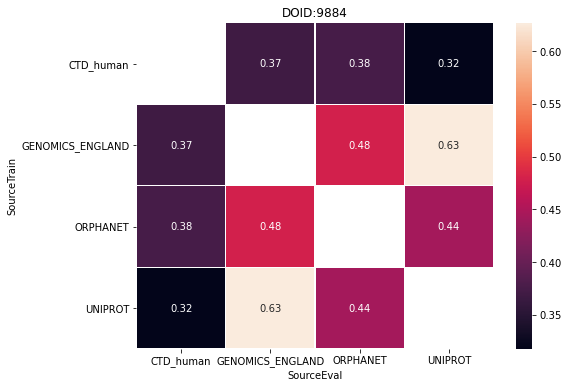

In [29]:
dict_of_DOIDS = dict(iter(resultGE.groupby('DOID')))

for DOID in dict_of_DOIDS:
    resulttrial = dict_of_DOIDS[DOID].pivot("SourceTrain", "SourceEval", "jaccardIndex")
    fig, ax = plt.subplots(figsize=(8,6))   
    ax = sns.heatmap(resulttrial, annot = True, linewidths = .25)
    plt.title(DOID)

In [30]:
#Function to run when you get the whole dataset:
import glob

path = "./eval"
all_files = glob.glob(path + "/*.tsv")
df = pd.concat((pd.read_csv(f, sep = '\t').assign(filename = f) for f in all_files))

df['filename'] = df['filename'].apply(lambda x: (x[7:]))
df[['DOID','SourceTrain']] = df.filename.str.split("_source=",expand=True)
df[['SourceTrain', 'Dummy', 'SourceEval']] = df.SourceTrain.str.split('=', expand = True)
df['SourceTrain'] = df['SourceTrain'].apply(lambda x: (x[:-6]))
df['SourceEval'] = df['SourceEval'].apply(lambda x: (x[:-4]))
df = df.drop(columns = ['filename', 'Dummy'])
df

,auROC,log2(auPRC/prior),log2(P@r10/prior),log2(P@r20/prior),log2(P@r50/prior),R@r10,R@r20,R@r50,DOID,SourceTrain,SourceEval
0,0.873233,2.614241,3.147584,2.799661,2.662157,0.148936,0.234043,0.531915,DOID:8692,CTD-human,CGI
0,0.708895,0.977403,1.990186,1.797541,1.191820,0.067797,0.118644,0.194915,DOID:936,CGI,UNIPROT
0,0.751768,1.353335,1.634851,1.634851,1.705241,0.055556,0.111111,0.291667,DOID:150,CTD-human,UNIPROT
0,0.645484,0.817277,1.232059,1.232059,1.232059,0.039216,0.078431,0.196078,DOID:263,UNIPROT,ORPHANET
0,0.813164,2.210550,3.086537,2.786976,2.349571,0.145455,0.236364,0.436364,DOID:2256,GENOMICS-ENGLAND,ORPHANET
...,...,...,...,...,...,...,...,...,...,...,...
0,0.773690,0.517985,0.348399,0.541044,0.645380,0.011532,0.026359,0.070840,DOID:74,GENOMICS-ENGLAND,CTD-human
0,0.672131,0.669673,-inf,-inf,-inf,0.000000,0.000000,0.000000,DOID:1793,GENOMICS-ENGLAND,UNIPROT
0,0.796087,1.007461,1.588456,1.353990,1.266528,0.036364,0.061818,0.145455,DOID:0080199,CTD-human,CTD-human
0,0.834118,0.460756,0.612854,0.612854,0.612854,0.011050,0.022099,0.055249,DOID:2914,CTD-human,CTD-human


In [31]:
resultGE

,DOID,SourceTrain,SourceEval,geneId1,geneId2,jaccardIndex
0,DOID:0014667,UNIPROT,CLINGEN,"{644096, 1537, 514, 140803, 90624, 3077, 10243...","{51204, 3081, 9997, 374291, 55572, 275, 55065,...",0.201413
1,DOID:0014667,UNIPROT,GENOMICS_ENGLAND,"{644096, 1537, 514, 140803, 90624, 3077, 10243...","{644096, 3073, 3074, 10243, 7172, 3077, 378884...",0.491031
2,DOID:0014667,UNIPROT,ORPHANET,"{644096, 1537, 514, 140803, 90624, 3077, 10243...","{644096, 513, 514, 140803, 10243, 3073, 3074, ...",0.430595
3,DOID:0014667,UNIPROT,CTD_human,"{644096, 1537, 514, 140803, 90624, 3077, 10243...","{2, 10243, 51204, 2053, 2055, 2056, 12, 18, 55...",0.243496
4,DOID:0014667,UNIPROT,PSYGENET,"{644096, 1537, 514, 140803, 90624, 3077, 10243...","{217, 125}",0.000000
...,...,...,...,...,...,...
1753,DOID:9884,GENOMICS_ENGLAND,UNIPROT,"{7169, 7170, 29954, 9987, 1291, 1292, 1293, 47...","{29954, 9987, 7170, 1291, 1292, 1293, 60684, 1...",0.627119
1754,DOID:9884,GENOMICS_ENGLAND,ORPHANET,"{7169, 7170, 29954, 9987, 1291, 1292, 1293, 47...","{7169, 1282, 29954, 9987, 1674, 1291, 1292, 12...",0.478873
1755,DOID:9884,ORPHANET,CTD_human,"{7169, 1282, 29954, 9987, 1674, 1291, 1292, 12...","{7169, 29954, 7170, 1281, 1026, 1291, 1292, 12...",0.375000
1756,DOID:9884,ORPHANET,UNIPROT,"{7169, 1282, 29954, 9987, 1674, 1291, 1292, 12...","{29954, 9987, 7170, 1291, 1292, 1293, 60684, 1...",0.444444


In [32]:
resultGE.loc[resultGE['SourceTrain'] == 'GENOMICS_ENGLAND', 'SourceTrain'] = 'GENOMICS-ENGLAND'

In [33]:
resultGE.loc[resultGE['SourceEval'] == 'CTD_human', 'SourceEval'] = 'CTD-human'

In [34]:
resultGE.loc[resultGE['SourceTrain'] == 'CTD_human', 'SourceTrain'] = 'CTD-human'

In [35]:
resultGE.loc[resultGE['SourceEval'] == 'GENOMICS_ENGLAND', 'SourceEval'] = 'GENOMICS-ENGLAND'

In [36]:
finale = df.merge(resultGE, how = 'outer', on = ['DOID', 'SourceTrain', 'SourceEval'])
finale

,auROC,log2(auPRC/prior),log2(P@r10/prior),log2(P@r20/prior),log2(P@r50/prior),R@r10,R@r20,R@r50,DOID,SourceTrain,SourceEval,geneId1,geneId2,jaccardIndex
0,0.873233,2.614241,3.147584,2.799661,2.662157,0.148936,0.234043,0.531915,DOID:8692,CTD-human,CGI,"{4609, 2052, 54790, 3082, 359948, 171023, 3605...","{2176, 2177, 2178, 3716, 4869, 3717, 3845, 730...",0.089202
1,0.708895,0.977403,1.990186,1.797541,1.191820,0.067797,0.118644,0.194915,DOID:936,CGI,UNIPROT,"{3845, 84231, 5395, 673, 546, 4771, 1956, 5156...","{3329, 1282, 2051, 1018, 378884, 57094, 55561,...",0.020408
2,0.751768,1.353335,1.634851,1.634851,1.705241,0.055556,0.111111,0.291667,DOID:150,CTD-human,UNIPROT,"{55297, 1, 10243, 4099, 2053, 151556, 79875, 2...","{7552, 10369, 8450, 23431, 6664, 55690, 1804, ...",0.062048
3,0.645484,0.817277,1.232059,1.232059,1.232059,0.039216,0.078431,0.196078,DOID:263,UNIPROT,ORPHANET,"{7428, 4233, 29072, 657, 53904, 2324, 2081, 67...","{2304, 283008, 3845, 7175, 51079, 51592, 4233,...",0.054795
4,0.813164,2.210550,3.086537,2.786976,2.349571,0.145455,0.236364,0.436364,DOID:2256,GENOMICS-ENGLAND,ORPHANET,"{1280, 23169, 64131, 6662, 6023, 4998, 5000, 8...","{1280, 23169, 64131, 6662, 8200, 649, 60681, 2...",0.476744
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DOID:8692,UNIPROT,CLINGEN,"{2146, 339970, 3717, 54790, 7403, 29072, 2322,...",{1050},0.076923
2145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DOID:8692,GENOMICS-ENGLAND,CLINGEN,"{2176, 641, 2177, 2178, 5888, 5889, 23305, 218...",{1050},0.028571
2146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DOID:8692,ORPHANET,CLINGEN,"{5573, 4869, 81608, 2120, 359948, 2322, 7704, ...",{1050},0.000000
2147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DOID:8692,CTD-human,CLINGEN,"{4609, 2052, 54790, 3082, 359948, 171023, 3605...",{1050},0.005405


In [37]:
trial = pd.read_csv('DesiredDataArjunAllDisease.tsv', sep = "\t")
trial

,dis_doid,dis_name,numgenes_CLINGEN,numgenes_CGI,numgenes_CTD_human,numgenes_GENOMICS_ENGLAND,numgenes_ORPHANET,numgenes_PSYGENET,numgenes_UNIPROT,numgenes_dir,numgenes_prop
0,DOID:162,cancer,32,307,2963,168,247,0,740,128,3574
1,DOID:863,nervous system disease,37,47,1657,974,601,0,553,53,2206
2,DOID:150,disease of mental health,21,0,955,433,92,1132,72,12,2069
3,DOID:77,gastrointestinal system disease,5,71,1433,162,76,0,553,12,1987
4,DOID:3119,gastrointestinal system cancer,3,76,993,29,17,0,528,6,1463
...,...,...,...,...,...,...,...,...,...,...,...
4817,DOID:0111367,error,0,0,1,1,1,0,1,1,1
4818,DOID:0111370,error,0,0,1,0,0,0,1,1,1
4819,DOID:0111371,error,0,0,1,0,1,0,1,1,1
4820,DOID:0111372,error,0,0,1,1,1,0,1,1,1


In [38]:
finale = finale.merge(selected)
finale

,auROC,log2(auPRC/prior),log2(P@r10/prior),log2(P@r20/prior),log2(P@r50/prior),R@r10,R@r20,R@r50,DOID,SourceTrain,...,numgenes_CLINGEN,numgenes_CGI,numgenes_CTD_human,numgenes_GENOMICS_ENGLAND,numgenes_ORPHANET,numgenes_PSYGENET,numgenes_UNIPROT,numgenes_dir,numgenes_prop,numsource_ge10
0,0.873233,2.614241,3.147584,2.799661,2.662157,0.148936,0.234043,0.531915,DOID:8692,CTD-human,...,1,47,185,35,20,0,13,26,240,5
1,0.718978,1.806436,2.505891,2.090853,1.991318,0.100000,0.150000,0.350000,DOID:8692,UNIPROT,...,1,47,185,35,20,0,13,26,240,5
2,0.752640,2.188159,3.147584,2.925191,2.105764,0.148936,0.255319,0.361702,DOID:8692,GENOMICS-ENGLAND,...,1,47,185,35,20,0,13,26,240,5
3,0.846142,2.938505,3.321103,3.195573,2.662140,0.171429,0.314286,0.542857,DOID:8692,CGI,...,1,47,185,35,20,0,13,26,240,5
4,0.845673,3.228809,3.736141,3.643032,2.806530,0.228571,0.428571,0.600000,DOID:8692,GENOMICS-ENGLAND,...,1,47,185,35,20,0,13,26,240,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,0.596632,0.821606,1.830357,0.830357,1.093391,0.062500,0.062500,0.187500,DOID:365,UNIPROT,...,0,16,148,0,0,0,10,5,163,3
2145,0.546655,0.155536,-inf,-inf,-inf,0.000000,0.000000,0.000000,DOID:365,UNIPROT,...,0,16,148,0,0,0,10,5,163,3
2146,0.797173,1.476324,1.736966,2.017074,2.000000,0.047619,0.115646,0.285714,DOID:365,CTD-human,...,0,16,148,0,0,0,10,5,163,3
2147,0.833635,3.221300,3.493135,3.815063,2.756169,0.200000,0.500000,0.600000,DOID:365,CTD-human,...,0,16,148,0,0,0,10,5,163,3


In [39]:
Trainlist = []
Evallist = []

for index, row in finale.iterrows():
    if (row['SourceTrain'] == 'CLINGEN'):
        temp = row['SourceTrain'] + ', ' + str(row['numgenes_CLINGEN'])
        Trainlist.append(temp)
    elif (row['SourceTrain'] == 'CGI'):
        temp = row['SourceTrain'] + ', ' + str(row['numgenes_CGI'])
        Trainlist.append(temp)
    elif (row['SourceTrain'] == 'CTD-human'):
        temp = row['SourceTrain'] + ', ' + str(row['numgenes_CTD_human'])
        Trainlist.append(temp)                                           
    elif (row['SourceTrain'] == 'GENOMICS-ENGLAND'):
        temp = row['SourceTrain'] + ', ' + str(row['numgenes_GENOMICS_ENGLAND'])
        Trainlist.append(temp)
    elif (row['SourceTrain'] == 'ORPHANET'):
        temp = row['SourceTrain'] + ', ' + str(row['numgenes_ORPHANET'])
        Trainlist.append(temp)
    elif (row['SourceTrain'] == 'PSYGENET'):
        temp = row['SourceTrain'] + ', ' + str(row['numgenes_PSYGENET'])
        Trainlist.append(temp)
    elif (row['SourceTrain'] == 'UNIPROT'):
        temp = row['SourceTrain'] + ', ' + str(row['numgenes_UNIPROT'])
        Trainlist.append(temp)
    
    if (row['SourceEval'] == 'CLINGEN'):
        temp2 = row['SourceEval'] + ', ' + str(row['numgenes_CLINGEN'])
        Evallist.append(temp)
    elif (row['SourceEval'] == 'CGI'):
        temp = row['SourceEval'] + ', ' + str(row['numgenes_CGI'])
        Evallist.append(temp)
    elif (row['SourceEval'] == 'CTD-human'):
        temp = row['SourceEval'] + ', ' + str(row['numgenes_CTD_human'])
        Evallist.append(temp)                                           
    elif (row['SourceEval'] == 'GENOMICS-ENGLAND'):
        temp = row['SourceEval'] + ', ' + str(row['numgenes_GENOMICS_ENGLAND'])
        Evallist.append(temp)
    elif (row['SourceEval'] == 'ORPHANET'):
        temp = row['SourceEval'] + ', ' + str(row['numgenes_ORPHANET'])
        Evallist.append(temp)
    elif (row['SourceEval'] == 'PSYGENET'):
        temp = row['SourceEval'] + ', ' + str(row['numgenes_PSYGENET'])
        Evallist.append(temp)
    elif (row['SourceEval'] == 'UNIPROT'):
        temp = row['SourceEval'] + ', ' + str(row['numgenes_UNIPROT'])
        Evallist.append(temp)

#finale['SourceTrainG'] = finale.apply(lambda row: row['SourceTrain'] + ', ' + str(row['numgenes_CLINGEN']), axis = 1)
#finale
                                              
Trainlist

['CTD-human, 185',
 'UNIPROT, 13',
 'GENOMICS-ENGLAND, 35',
 'CGI, 47',
 'GENOMICS-ENGLAND, 35',
 'UNIPROT, 13',
 'CLINGEN, 1',
 'CLINGEN, 1',
 'CLINGEN, 1',
 'CGI, 47',
 'CTD-human, 185',
 'CTD-human, 185',
 'CLINGEN, 1',
 'CGI, 47',
 'UNIPROT, 13',
 'ORPHANET, 20',
 'CTD-human, 185',
 'CGI, 47',
 'CLINGEN, 1',
 'ORPHANET, 20',
 'UNIPROT, 13',
 'GENOMICS-ENGLAND, 35',
 'CTD-human, 185',
 'ORPHANET, 20',
 'UNIPROT, 13',
 'ORPHANET, 20',
 'GENOMICS-ENGLAND, 35',
 'CGI, 47',
 'GENOMICS-ENGLAND, 35',
 'ORPHANET, 20',
 'UNIPROT, 13',
 'GENOMICS-ENGLAND, 35',
 'ORPHANET, 20',
 'CTD-human, 185',
 'CGI, 47',
 'CGI, 32',
 'ORPHANET, 156',
 'CLINGEN, 15',
 'CGI, 32',
 'GENOMICS-ENGLAND, 320',
 'CTD-human, 747',
 'CGI, 32',
 'CLINGEN, 15',
 'UNIPROT, 118',
 'UNIPROT, 118',
 'ORPHANET, 156',
 'CGI, 32',
 'CTD-human, 747',
 'CLINGEN, 15',
 'ORPHANET, 156',
 'GENOMICS-ENGLAND, 320',
 'CGI, 32',
 'ORPHANET, 156',
 'CTD-human, 747',
 'GENOMICS-ENGLAND, 320',
 'ORPHANET, 156',
 'CTD-human, 747',
 'UNI

In [40]:
finale['SourceTrainG'] = Trainlist
finale['SourceEvalG'] = Evallist
pd.set_option('max_columns', None)
finale

,auROC,log2(auPRC/prior),log2(P@r10/prior),log2(P@r20/prior),log2(P@r50/prior),R@r10,R@r20,R@r50,DOID,SourceTrain,SourceEval,geneId1,geneId2,jaccardIndex,dis_name,numgenes_CLINGEN,numgenes_CGI,numgenes_CTD_human,numgenes_GENOMICS_ENGLAND,numgenes_ORPHANET,numgenes_PSYGENET,numgenes_UNIPROT,numgenes_dir,numgenes_prop,numsource_ge10,SourceTrainG,SourceEvalG
0,0.873233,2.614241,3.147584,2.799661,2.662157,0.148936,0.234043,0.531915,DOID:8692,CTD-human,CGI,"{4609, 2052, 54790, 3082, 359948, 171023, 3605...","{2176, 2177, 2178, 3716, 4869, 3717, 3845, 730...",0.089202,myeloid leukemia,1,47,185,35,20,0,13,26,240,5,"CTD-human, 185","CGI, 47"
1,0.718978,1.806436,2.505891,2.090853,1.991318,0.100000,0.150000,0.350000,DOID:8692,UNIPROT,ORPHANET,"{2146, 339970, 3717, 54790, 7403, 29072, 2322,...","{5573, 4869, 81608, 2120, 359948, 2322, 7704, ...",0.031250,myeloid leukemia,1,47,185,35,20,0,13,26,240,5,"UNIPROT, 13","ORPHANET, 20"
2,0.752640,2.188159,3.147584,2.925191,2.105764,0.148936,0.255319,0.361702,DOID:8692,GENOMICS-ENGLAND,CGI,"{2176, 641, 2177, 2178, 5888, 5889, 23305, 218...","{2176, 2177, 2178, 3716, 4869, 3717, 3845, 730...",0.223881,myeloid leukemia,1,47,185,35,20,0,13,26,240,5,"GENOMICS-ENGLAND, 35","CGI, 47"
3,0.846142,2.938505,3.321103,3.195573,2.662140,0.171429,0.314286,0.542857,DOID:8692,CGI,GENOMICS-ENGLAND,"{2176, 2177, 2178, 3716, 4869, 3717, 3845, 730...","{2176, 641, 2177, 2178, 5888, 5889, 23305, 218...",0.223881,myeloid leukemia,1,47,185,35,20,0,13,26,240,5,"CGI, 47","GENOMICS-ENGLAND, 35"
4,0.845673,3.228809,3.736141,3.643032,2.806530,0.228571,0.428571,0.600000,DOID:8692,GENOMICS-ENGLAND,GENOMICS-ENGLAND,NaN,NaN,NaN,myeloid leukemia,1,47,185,35,20,0,13,26,240,5,"GENOMICS-ENGLAND, 35","GENOMICS-ENGLAND, 35"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,0.596632,0.821606,1.830357,0.830357,1.093391,0.062500,0.062500,0.187500,DOID:365,UNIPROT,CGI,"{3265, 675, 3845, 613, 2043, 7273, 2321, 2261,...","{2176, 3265, 3845, 7248, 2065, 2068, 2261, 472...",0.130435,bladder disease,0,16,148,0,0,0,10,5,163,3,"UNIPROT, 10","CGI, 16"
2145,0.546655,0.155536,-inf,-inf,-inf,0.000000,0.000000,0.000000,DOID:365,UNIPROT,UNIPROT,NaN,NaN,NaN,bladder disease,0,16,148,0,0,0,10,5,163,3,"UNIPROT, 10","UNIPROT, 10"
2146,0.797173,1.476324,1.736966,2.017074,2.000000,0.047619,0.115646,0.285714,DOID:365,CTD-human,CTD-human,NaN,NaN,NaN,bladder disease,0,16,148,0,0,0,10,5,163,3,"CTD-human, 148","CTD-human, 148"
2147,0.833635,3.221300,3.493135,3.815063,2.756169,0.200000,0.500000,0.600000,DOID:365,CTD-human,UNIPROT,"{513, 1026, 4609, 6657, 1029, 79366, 407041, 3...","{3265, 675, 3845, 613, 2043, 7273, 2321, 2261,...",0.019355,bladder disease,0,16,148,0,0,0,10,5,163,3,"CTD-human, 148","UNIPROT, 10"


In [41]:
finale.columns

Index(['auROC', 'log2(auPRC/prior)', 'log2(P@r10/prior)', 'log2(P@r20/prior)',
       'log2(P@r50/prior)', 'R@r10', 'R@r20', 'R@r50', 'DOID', 'SourceTrain',
       'SourceEval', 'geneId1', 'geneId2', 'jaccardIndex', 'dis_name',
       'numgenes_CLINGEN', 'numgenes_CGI', 'numgenes_CTD_human',
       'numgenes_GENOMICS_ENGLAND', 'numgenes_ORPHANET', 'numgenes_PSYGENET',
       'numgenes_UNIPROT', 'numgenes_dir', 'numgenes_prop', 'numsource_ge10',
       'SourceTrainG', 'SourceEvalG'],
      dtype='object')

In [42]:
dictGeneCounts = selected.set_index('DOID').to_dict()['numgenes_prop']

In [43]:
dict_of_DOIDS = dict(iter(finale.groupby('DOID')))

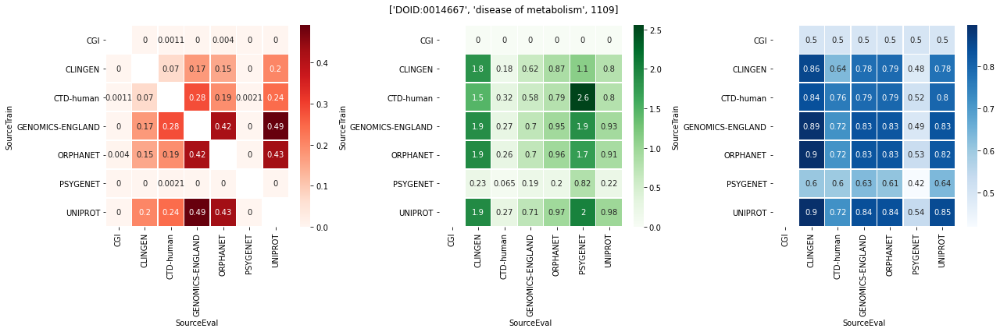

In [44]:
for DOID in dict_of_DOIDS:
    
    resultJaccard = dict_of_DOIDS[DOID].pivot("SourceTrain", "SourceEval", "jaccardIndex")
    resultLog = dict_of_DOIDS[DOID].pivot("SourceTrain", "SourceEval", "log2(auPRC/prior)")
    resultauROC = dict_of_DOIDS[DOID].pivot("SourceTrain", "SourceEval", "auROC")
    plt.rcParams["figure.figsize"] = [18,6]
    fig, axes = plt.subplots(1, 3)
    #fig, ax = plt.subplots(figsize=(8,6))   
    sns.heatmap(resultJaccard, annot = True, linewidths = .25, ax=axes[0], cmap = 'Reds')
    #plt.xlabel("labels on x axis")
    sns.heatmap(resultLog, annot = True, linewidths = .25, ax=axes[1], cmap = 'Greens')
    sns.heatmap(resultauROC, annot = True, linewidths = .25, ax=axes[2], cmap = 'Blues')
    
    name = disease_ontology.nodes[DOID]["name"]
    genecount = dictGeneCounts[DOID]
    plt.suptitle(t = [DOID, name, genecount])
    #plt.title(label = [DOID, name], loc = 'center')
    
    plt.tight_layout()
    plt.show()
    break

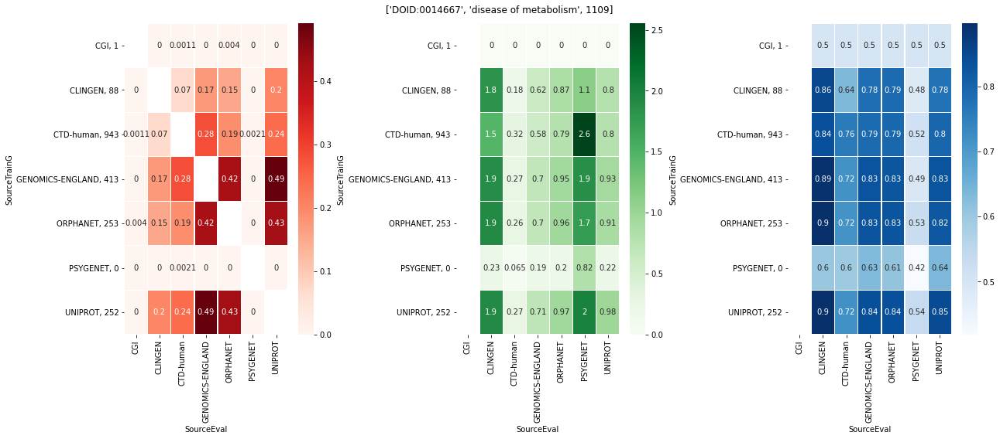

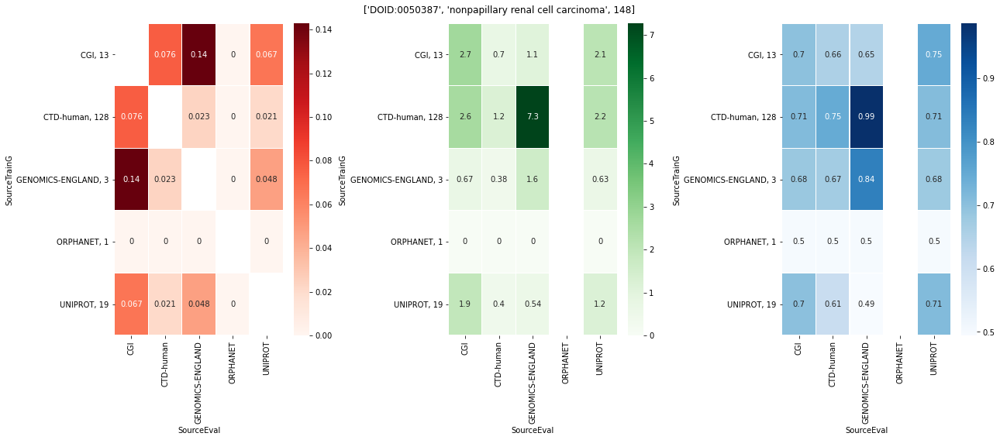

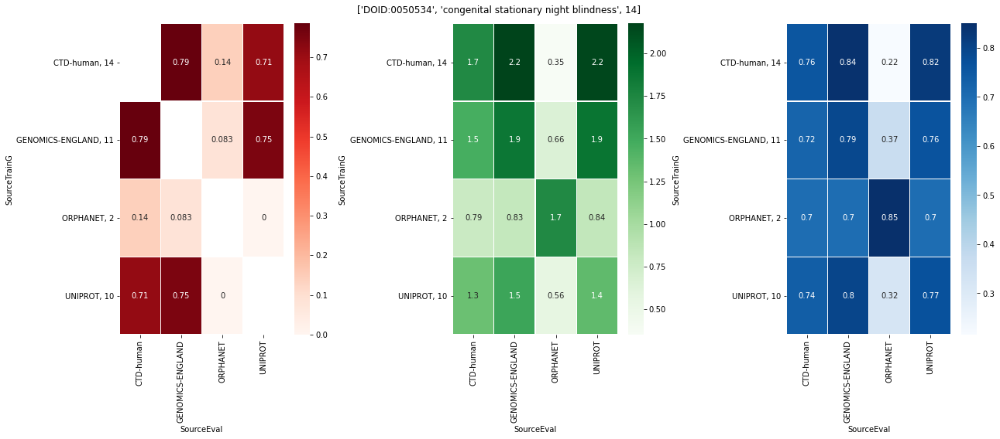

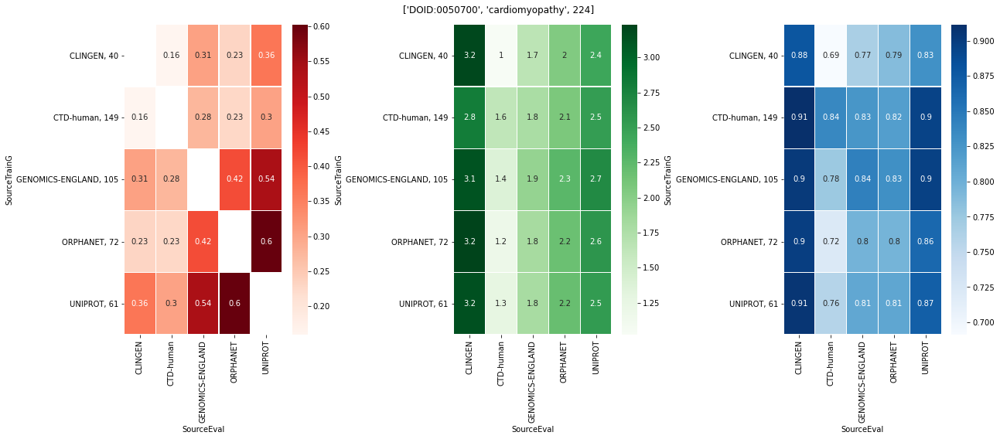

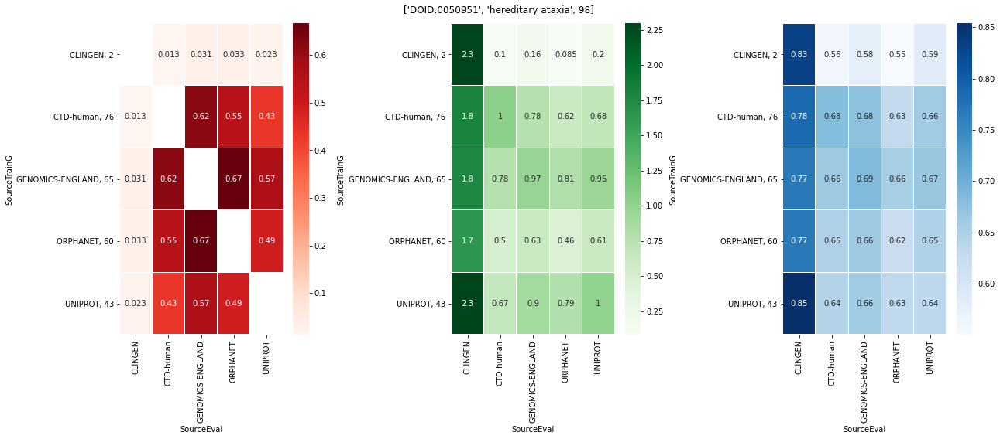

...

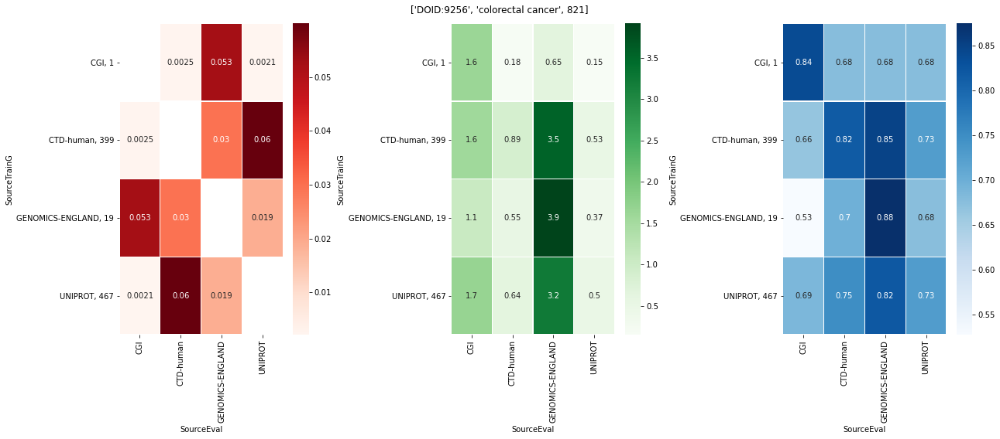

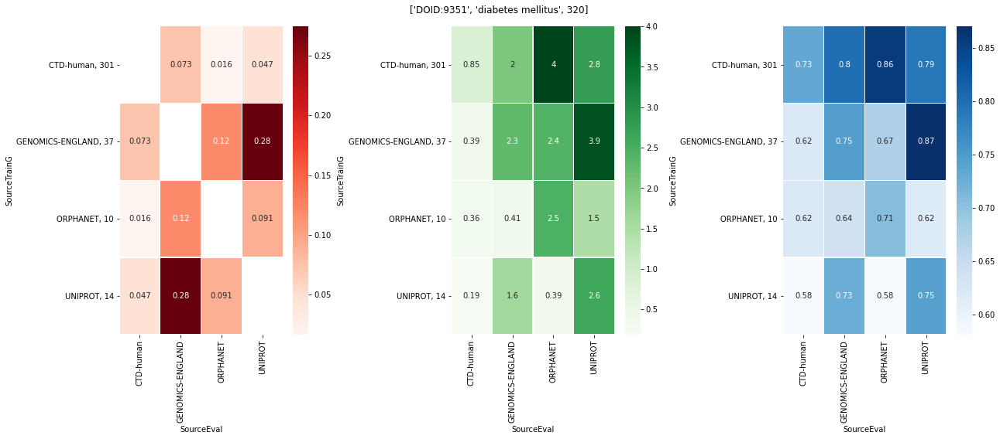

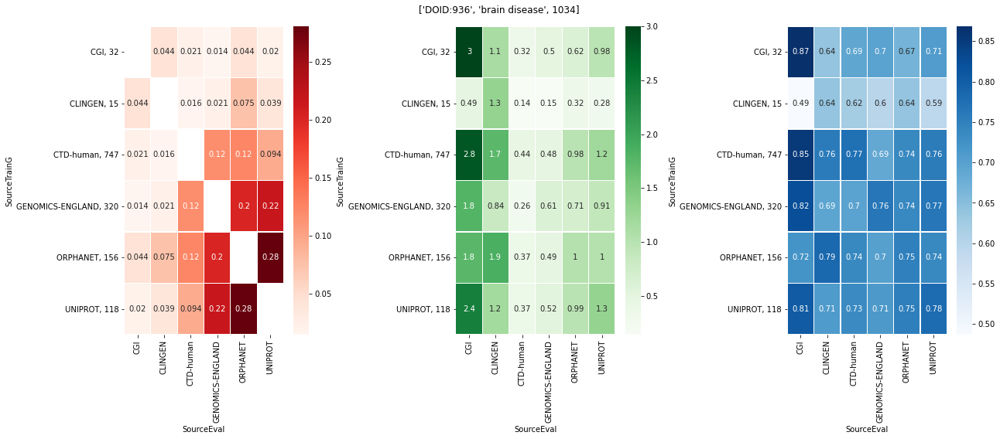

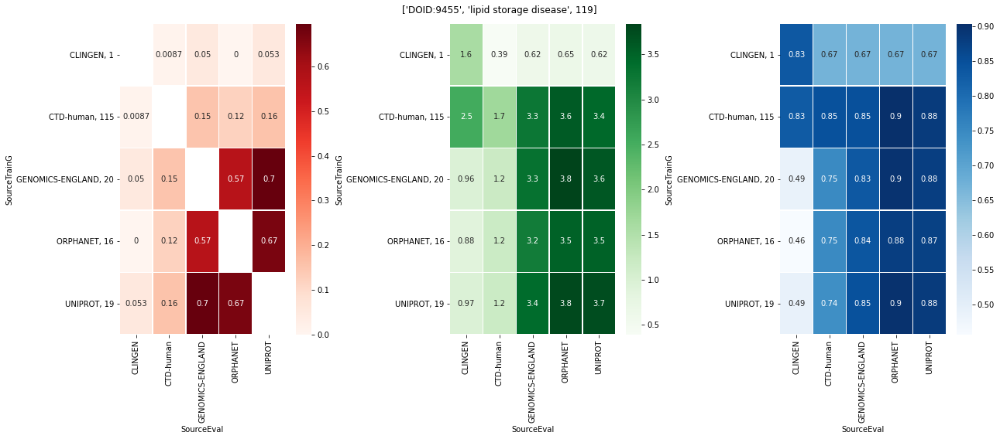

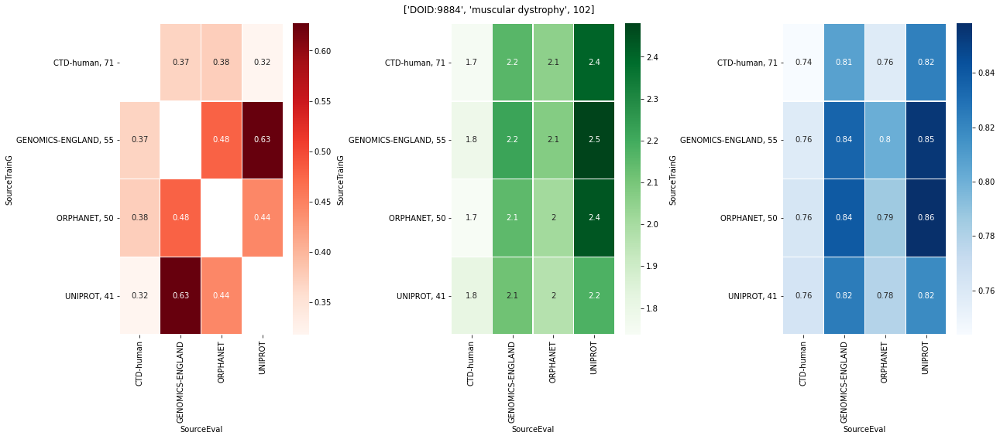

In [45]:
for DOID in dict_of_DOIDS:
    
    resultJaccard = dict_of_DOIDS[DOID].pivot("SourceTrainG", "SourceEval", "jaccardIndex")
    resultLog = dict_of_DOIDS[DOID].pivot("SourceTrainG", "SourceEval", "log2(auPRC/prior)")
    resultauROC = dict_of_DOIDS[DOID].pivot("SourceTrainG", "SourceEval", "auROC")
    plt.rcParams["figure.figsize"] = [18,5]
    fig, axes = plt.subplots(1, 3)
    #fig, ax = plt.subplots(figsize=(8,6))   
    sns.heatmap(resultJaccard, annot = True, linewidths = .25, ax=axes[0], cmap = 'Reds')
    #plt.xlabel("labels on x axis")
    sns.heatmap(resultLog, annot = True, linewidths = .25, ax=axes[1], cmap = 'Greens')
    sns.heatmap(resultauROC, annot = True, linewidths = .25, ax=axes[2], cmap = 'Blues')
    
    name = disease_ontology.nodes[DOID]["name"]
    genecount = dictGeneCounts[DOID]
    plt.suptitle(t = [DOID, name, genecount])
    #plt.title(label = [DOID, name], loc = 'center')
    
    plt.tight_layout()
    plt.show()
    

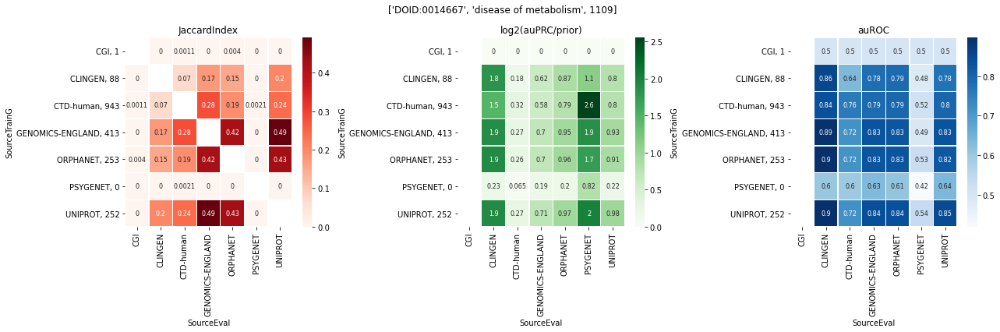

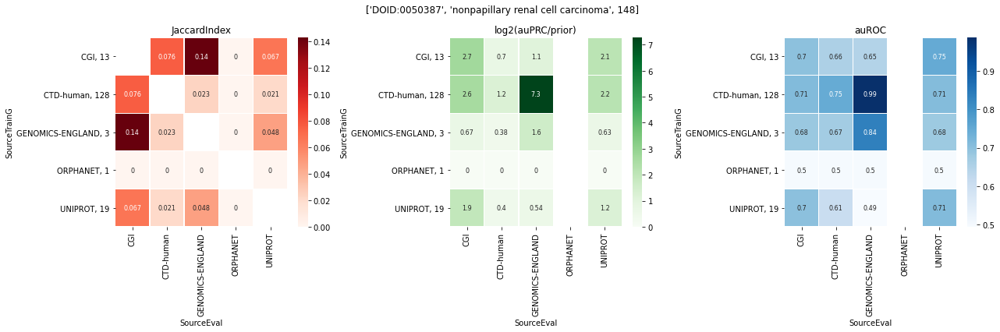

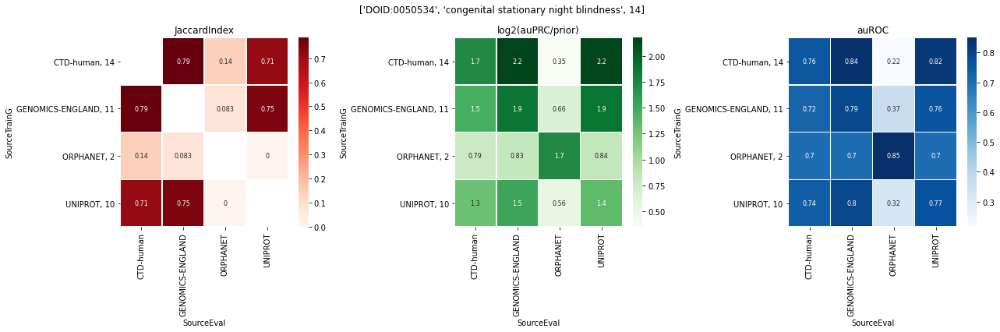

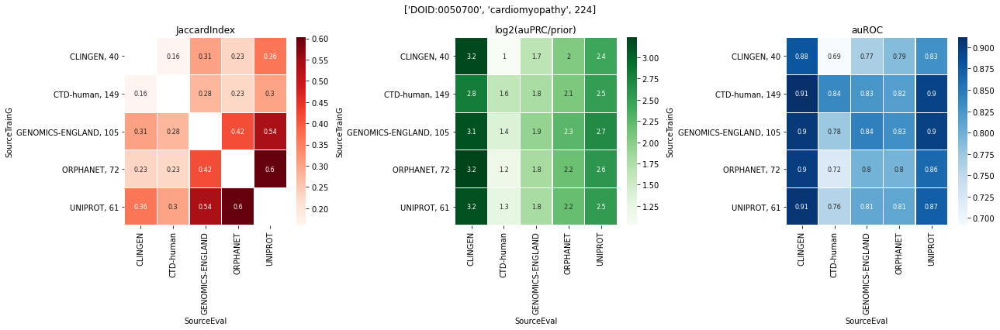

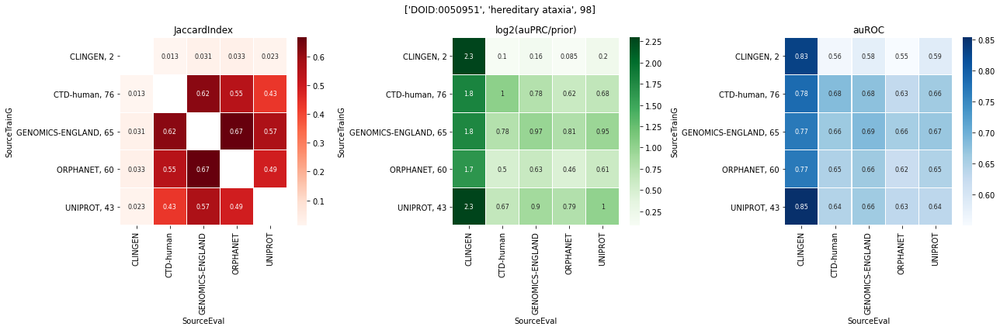

...

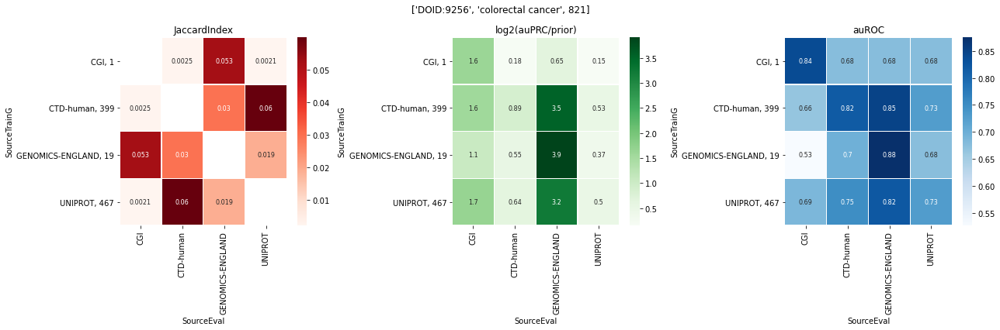

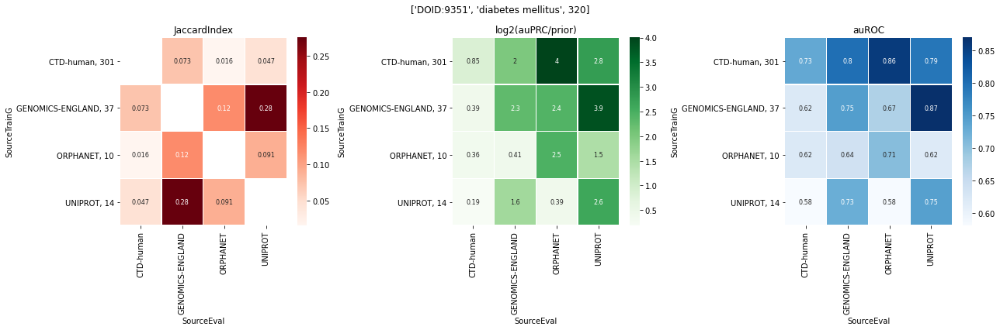

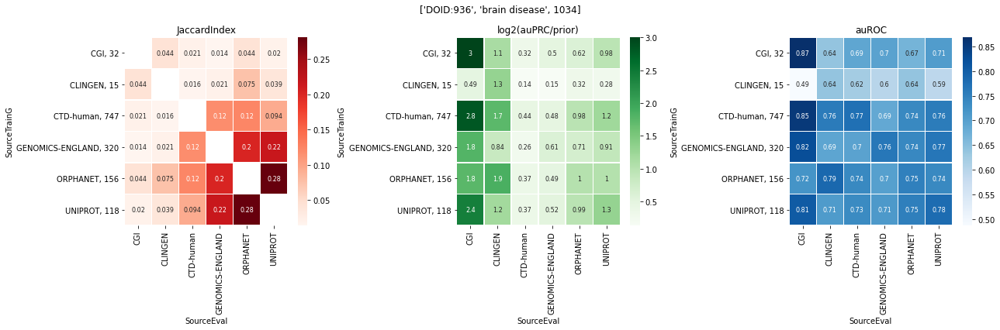

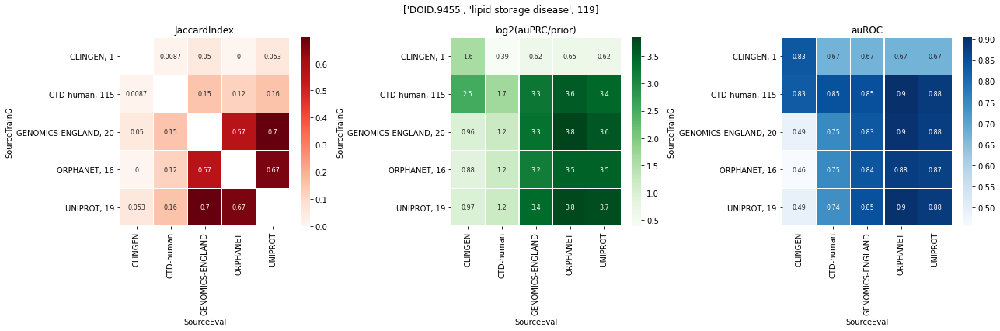

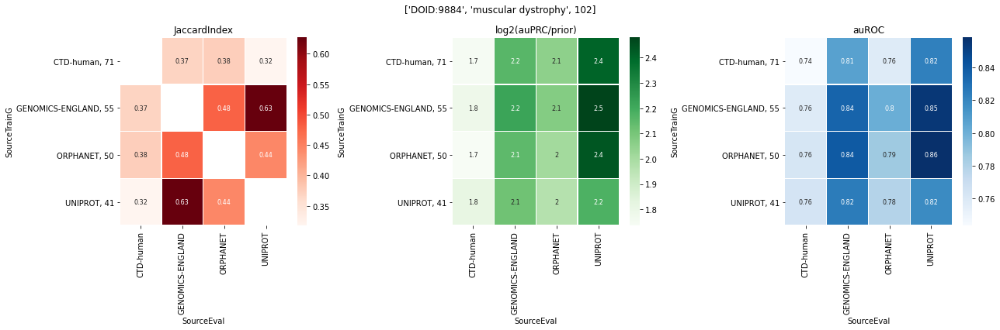

In [46]:
for DOID in dict_of_DOIDS:
    
    resultJaccard = dict_of_DOIDS[DOID].pivot("SourceTrainG", "SourceEval", "jaccardIndex")
    resultLog = dict_of_DOIDS[DOID].pivot("SourceTrainG", "SourceEval", "log2(auPRC/prior)")
    resultauROC = dict_of_DOIDS[DOID].pivot("SourceTrainG", "SourceEval", "auROC")
    plt.rcParams["figure.figsize"] = [18,6]
    
    f,(ax1,ax2,ax3) = plt.subplots(1,3)
    
    g1 = sns.heatmap(resultJaccard, annot = True, linewidths = .25, ax=ax1, cmap = 'Reds', annot_kws = {"size": 8})
    g1.set_title('JaccardIndex')
    
    g2 = sns.heatmap(resultLog, annot = True, linewidths = .25, ax=ax2, cmap = 'Greens', annot_kws = {"size": 8})
    g2.set_title('log2(auPRC/prior)')
    
    g3 = sns.heatmap(resultauROC, annot = True, linewidths = .25, ax=ax3, cmap = 'Blues', annot_kws = {"size": 8})
    g3.set_title('auROC')
    
    name = disease_ontology.nodes[DOID]["name"]
    genecount = dictGeneCounts[DOID]
    plt.suptitle(t = [DOID, name, genecount])
    #plt.title(label = [DOID, name], loc = 'center')
    
    plt.tight_layout()
    plt.show()
    

ValueError: The condensed distance matrix must contain only finite values.

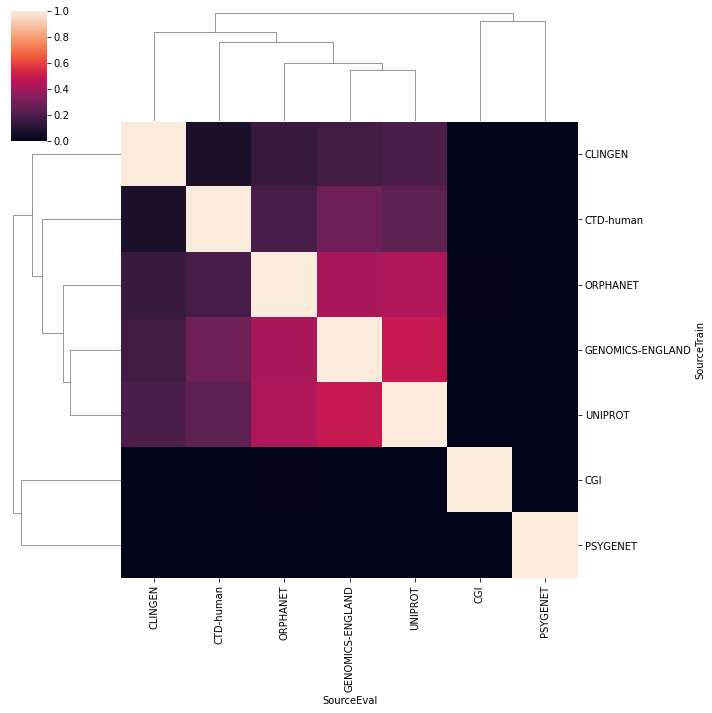

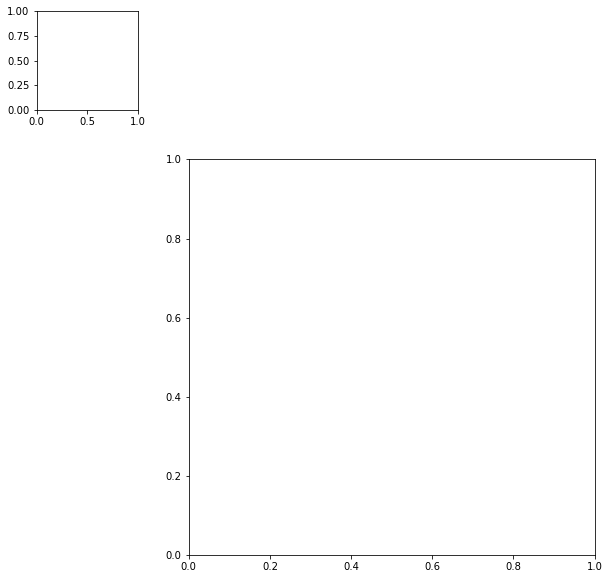

In [52]:
for DOID in dict_of_DOIDS:
    #resultJaccard = dict_of_DOIDS[DOID].pivot("SourceTrain", "SourceEval", "jaccardIndex")
    #resultLog = dict_of_DOIDS[DOID].pivot("SourceTrain", "SourceEval", "log2(auPRC/prior)")
    #resultauROC = dict_of_DOIDS[DOID].pivot("SourceTrain", "SourceEval", "auROC")
    #plt.rcParams["figure.figsize"] = [18,8]
    #fig, axes = plt.subplots(1, 3)
    #fig, ax = plt.subplots(figsize=(8,6))   
    sns.clustermap(resultJaccard)
    #plt.xlabel("labels on x axis")
    sns.clustermap(resultLog)
    sns.clustermap(resultauROC)
    
    name = disease_ontology.nodes[DOID]["name"]
    genecount = dictGeneCounts[DOID]
    plt.suptitle(t = [DOID, name, genecount])
    #plt.title(label = [DOID, name], loc = 'center')
    
    plt.tight_layout()
    plt.show()
    break

In [46]:
finale.to_csv('temporary.csv', index = False)

In [3]:
df = pd.read_csv('temporary.csv')
df

,auROC,log2(auPRC/prior),log2(P@r10/prior),log2(P@r20/prior),log2(P@r50/prior),R@r10,R@r20,R@r50,DOID,SourceTrain,...,numgenes_CTD_human,numgenes_GENOMICS_ENGLAND,numgenes_ORPHANET,numgenes_PSYGENET,numgenes_UNIPROT,numgenes_dir,numgenes_prop,numsource_ge10,SourceTrainG,SourceEvalG
0,0.873233,2.614241,3.147584,2.799661,2.662157,0.148936,0.234043,0.531915,DOID:8692,CTD-human,...,185,35,20,0,13,26,240,5,"CTD-human, 185","CGI, 47"
1,0.718978,1.806436,2.505891,2.090853,1.991318,0.100000,0.150000,0.350000,DOID:8692,UNIPROT,...,185,35,20,0,13,26,240,5,"UNIPROT, 13","ORPHANET, 20"
2,0.752640,2.188159,3.147584,2.925191,2.105764,0.148936,0.255319,0.361702,DOID:8692,GENOMICS-ENGLAND,...,185,35,20,0,13,26,240,5,"GENOMICS-ENGLAND, 35","CGI, 47"
3,0.846142,2.938505,3.321103,3.195573,2.662140,0.171429,0.314286,0.542857,DOID:8692,CGI,...,185,35,20,0,13,26,240,5,"CGI, 47","GENOMICS-ENGLAND, 35"
4,0.845673,3.228809,3.736141,3.643032,2.806530,0.228571,0.428571,0.600000,DOID:8692,GENOMICS-ENGLAND,...,185,35,20,0,13,26,240,5,"GENOMICS-ENGLAND, 35","GENOMICS-ENGLAND, 35"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,0.596632,0.821606,1.830357,0.830357,1.093391,0.062500,0.062500,0.187500,DOID:365,UNIPROT,...,148,0,0,0,10,5,163,3,"UNIPROT, 10","CGI, 16"
2145,0.546655,0.155536,-inf,-inf,-inf,0.000000,0.000000,0.000000,DOID:365,UNIPROT,...,148,0,0,0,10,5,163,3,"UNIPROT, 10","UNIPROT, 10"
2146,0.797173,1.476324,1.736966,2.017074,2.000000,0.047619,0.115646,0.285714,DOID:365,CTD-human,...,148,0,0,0,10,5,163,3,"CTD-human, 148","CTD-human, 148"
2147,0.833635,3.221300,3.493135,3.815063,2.756169,0.200000,0.500000,0.600000,DOID:365,CTD-human,...,148,0,0,0,10,5,163,3,"CTD-human, 148","UNIPROT, 10"


In [7]:
df.columns

Index(['auROC', 'log2(auPRC/prior)', 'log2(P@r10/prior)', 'log2(P@r20/prior)',
       'log2(P@r50/prior)', 'R@r10', 'R@r20', 'R@r50', 'DOID', 'SourceTrain',
       'SourceEval', 'geneId1', 'geneId2', 'jaccardIndex', 'dis_name',
       'numgenes_CLINGEN', 'numgenes_CGI', 'numgenes_CTD_human',
       'numgenes_GENOMICS_ENGLAND', 'numgenes_ORPHANET', 'numgenes_PSYGENET',
       'numgenes_UNIPROT', 'numgenes_dir', 'numgenes_prop', 'numsource_ge10',
       'SourceTrainG', 'SourceEvalG'],
      dtype='object')

In [3]:
#def f(x):
#    return list(x)

In [5]:
#test = df[['SourceTrain', 'SourceEval', 'jaccardIndex', 'log2(auPRC/prior)', 'auROC']]
#test2 = test.groupby(['SourceTrain', 'SourceEval'])['jaccardIndex'].apply(lambda x: [x])#
#test2 = test2.reset_index()
#df.apply(lambda x: get_sublist(x.col_1, x.col_2), axis=1)
#[['jaccardIndex', 'log2(auPRC/prior)', 'auROC']].apply(lambda x: list(x))
#.apply(lambda x: f(x.jaccardIndex, x[log2(auPRC/prior)], x.auROC))

In [19]:
#testing = test.groupby(['SourceTrain', 'SourceEval'])[['jaccardIndex', 'log2(auPRC/prior)', 'auROC']].apply(list)

TypeError: unhashable type: 'list'

In [3]:
df4 = df.groupby(by = ['SourceTrain', 'SourceEval'])['auROC'].apply(lambda x: list(x))
df4 = df4.reset_index()
df4

,SourceTrain,SourceEval,auROC
0,CGI,CGI,"[0.8422891753377854, 0.8683894230769231, 0.699..."
1,CGI,CLINGEN,"[nan, 0.6393162393162393, 0.9744525547445256, ..."
2,CGI,CTD-human,"[0.8218160424394719, 0.6925600871909596, 0.673..."
3,CGI,GENOMICS-ENGLAND,"[0.8461418143899896, 0.6978214564965353, 0.571..."
4,CGI,ORPHANET,"[0.9074817518248176, 0.6675382366171839, 0.698..."
5,CGI,PSYGENET,[0.5]
6,CGI,UNIPROT,"[0.7748455923638407, 0.7088946834709547, 0.757..."
7,CLINGEN,CGI,"[0.5, 0.4869791666666666, 0.6551094890510949, ..."
8,CLINGEN,CLINGEN,"[nan, 0.6403133903133903, 0.6918940060623837, ..."
9,CLINGEN,CTD-human,"[0.5, 0.6234641197728445, 0.6526115050000216, ..."


In [4]:
metricsets = df4['auROC']
medians = []
for list in metricsets:
    medians.append(statistics.median(list))
df4['medianauROC'] = medians
df4

,SourceTrain,SourceEval,auROC,medianauROC
0,CGI,CGI,"[0.8422891753377854, 0.8683894230769231, 0.699...",0.854133
1,CGI,CLINGEN,"[nan, 0.6393162393162393, 0.9744525547445256, ...",0.715022
2,CGI,CTD-human,"[0.8218160424394719, 0.6925600871909596, 0.673...",0.700947
3,CGI,GENOMICS-ENGLAND,"[0.8461418143899896, 0.6978214564965353, 0.571...",0.717489
4,CGI,ORPHANET,"[0.9074817518248176, 0.6675382366171839, 0.698...",0.757529
5,CGI,PSYGENET,[0.5],0.500000
6,CGI,UNIPROT,"[0.7748455923638407, 0.7088946834709547, 0.757...",0.744846
7,CLINGEN,CGI,"[0.5, 0.4869791666666666, 0.6551094890510949, ...",0.578336
8,CLINGEN,CLINGEN,"[nan, 0.6403133903133903, 0.6918940060623837, ...",0.826287
9,CLINGEN,CTD-human,"[0.5, 0.6234641197728445, 0.6526115050000216, ...",0.652612


In [5]:
df4.to_csv('df4.csv', index = False)

In [4]:
df4 = pd.read_csv('df4.csv')

In [4]:
df2 = df.groupby(by = ['SourceTrain', 'SourceEval'])['log2(auPRC/prior)'].apply(lambda x: list(x))
df2 = df2.reset_index()
df2

,SourceTrain,SourceEval,log2(auPRC/prior)
0,CGI,CGI,"[2.698849837862657, 3.000408159694417, 2.51223..."
1,CGI,CLINGEN,"[nan, 1.1439661979693712, 5.19377174339668, 4...."
2,CGI,CTD-human,"[1.2351175352853816, 0.322752944686915, 0.6737..."
3,CGI,GENOMICS-ENGLAND,"[2.938505328033676, 0.5021089908237251, 0.6831..."
4,CGI,ORPHANET,"[3.6483314150813184, 0.6159831255034284, 1.332..."
5,CGI,PSYGENET,[0.0]
6,CGI,UNIPROT,"[3.2694232488656776, 0.9774032331983116, 1.799..."
7,CLINGEN,CGI,"[0.0, 0.4861779069716332, 0.552601509526756, -..."
8,CLINGEN,CLINGEN,"[nan, 1.3089253805853611, 1.4675598869849087, ..."
9,CLINGEN,CTD-human,"[0.0, 0.1391658145280197, 0.1762350656313407, ..."


In [5]:
metricsets = df2['log2(auPRC/prior)']
medians = []
for list in metricsets:
    medians.append(statistics.median(list))
df2['Medianlog'] = medians
df2

,SourceTrain,SourceEval,log2(auPRC/prior),Medianlog
0,CGI,CGI,"[2.698849837862657, 3.000408159694417, 2.51223...",2.823992
1,CGI,CLINGEN,"[nan, 1.1439661979693712, 5.19377174339668, 4....",2.099755
2,CGI,CTD-human,"[1.2351175352853816, 0.322752944686915, 0.6737...",0.549997
3,CGI,GENOMICS-ENGLAND,"[2.938505328033676, 0.5021089908237251, 0.6831...",1.125841
4,CGI,ORPHANET,"[3.6483314150813184, 0.6159831255034284, 1.332...",1.806968
5,CGI,PSYGENET,[0.0],0.000000
6,CGI,UNIPROT,"[3.2694232488656776, 0.9774032331983116, 1.799...",1.496476
7,CLINGEN,CGI,"[0.0, 0.4861779069716332, 0.552601509526756, -...",0.475823
8,CLINGEN,CLINGEN,"[nan, 1.3089253805853611, 1.4675598869849087, ...",1.595551
9,CLINGEN,CTD-human,"[0.0, 0.1391658145280197, 0.1762350656313407, ...",0.197292


In [7]:
df2.to_csv('df2.csv', index = False)

In [5]:
df2 = pd.read_csv('df2.csv')

In [6]:
df3 = df.groupby(by = ['SourceTrain', 'SourceEval'])['jaccardIndex'].apply(lambda x: list(x))
df3 = df3.reset_index()
df3

,SourceTrain,SourceEval,jaccardIndex
0,CGI,CGI,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
1,CGI,CLINGEN,"[0.0212765957446808, 0.0444444444444444, 0.095..."
2,CGI,CTD-human,"[0.0892018779342723, 0.0209698558322411, 0.095..."
3,CGI,GENOMICS-ENGLAND,"[0.2238805970149253, 0.0144092219020172, 0.259..."
4,CGI,ORPHANET,"[0.135593220338983, 0.0444444444444444, 0.0895..."
5,CGI,PSYGENET,[0.0]
6,CGI,UNIPROT,"[0.1111111111111111, 0.0204081632653061, 0.121..."
7,CLINGEN,CGI,"[0.0212765957446808, 0.0444444444444444, 0.095..."
8,CLINGEN,CLINGEN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ..."
9,CLINGEN,CTD-human,"[0.0054054054054054, 0.016, 0.0156087408949011..."


In [7]:
metricsets = df3['jaccardIndex']
medians = []
for list in metricsets:
    medians.append(statistics.median(list))
df3['medianJaccard'] = medians
df3

,SourceTrain,SourceEval,jaccardIndex,medianJaccard
0,CGI,CGI,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN
1,CGI,CLINGEN,"[0.0212765957446808, 0.0444444444444444, 0.095...",0.023016
2,CGI,CTD-human,"[0.0892018779342723, 0.0209698558322411, 0.095...",0.050095
3,CGI,GENOMICS-ENGLAND,"[0.2238805970149253, 0.0144092219020172, 0.259...",0.087999
4,CGI,ORPHANET,"[0.135593220338983, 0.0444444444444444, 0.0895...",0.058574
5,CGI,PSYGENET,[0.0],0.000000
6,CGI,UNIPROT,"[0.1111111111111111, 0.0204081632653061, 0.121...",0.066667
7,CLINGEN,CGI,"[0.0212765957446808, 0.0444444444444444, 0.095...",0.023016
8,CLINGEN,CLINGEN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN
9,CLINGEN,CTD-human,"[0.0054054054054054, 0.016, 0.0156087408949011...",0.010753


In [8]:
merge1 = df4.merge(df2)
merge1

,SourceTrain,SourceEval,auROC,medianauROC,log2(auPRC/prior),Medianlog
0,CGI,CGI,"[0.8422891753377854, 0.8683894230769231, 0.699...",0.854133,"[2.698849837862657, 3.000408159694417, 2.51223...",2.823992
1,CGI,CLINGEN,"[nan, 0.6393162393162393, 0.9744525547445256, ...",0.715022,"[nan, 1.1439661979693712, 5.19377174339668, 4....",2.099755
2,CGI,CTD-human,"[0.8218160424394719, 0.6925600871909596, 0.673...",0.700947,"[1.2351175352853816, 0.322752944686915, 0.6737...",0.549997
3,CGI,GENOMICS-ENGLAND,"[0.8461418143899896, 0.6978214564965353, 0.571...",0.717489,"[2.938505328033676, 0.5021089908237251, 0.6831...",1.125841
4,CGI,ORPHANET,"[0.9074817518248176, 0.6675382366171839, 0.698...",0.757529,"[3.6483314150813184, 0.6159831255034284, 1.332...",1.806968
5,CGI,PSYGENET,[0.5],0.500000,[0.0],0.000000
6,CGI,UNIPROT,"[0.7748455923638407, 0.7088946834709547, 0.757...",0.744846,"[3.2694232488656776, 0.9774032331983116, 1.799...",1.496476
7,CLINGEN,CGI,"[0.5, 0.4869791666666666, 0.6551094890510949, ...",0.578336,"[0.0, 0.4861779069716332, 0.552601509526756, -...",0.475823
8,CLINGEN,CLINGEN,"[nan, 0.6403133903133903, 0.6918940060623837, ...",0.826287,"[nan, 1.3089253805853611, 1.4675598869849087, ...",1.595551
9,CLINGEN,CTD-human,"[0.5, 0.6234641197728445, 0.6526115050000216, ...",0.652612,"[0.0, 0.1391658145280197, 0.1762350656313407, ...",0.197292


In [ ]:
resultJaccard2 = merge2.pivot("SourceTrain", "SourceEval", "medianJaccard")
resultLog2 = merge2.pivot("SourceTrain", "SourceEval", "Medianlog")
resultauROC2 = merge2.pivot("SourceTrain", "SourceEval", "medianauROC")
plt.rcParams["figure.figsize"] = [18,8]
fig, axes = plt.subplots(1, 3)
#fig, ax = plt.subplots(figsize=(8,6))   
sns.heatmap(resultJaccard2, annot = True, linewidths = .25, ax=axes[0], cmap = 'Reds')
#plt.xlabel("labels on x axis")
sns.heatmap(resultLog2, annot = True, linewidths = .25, ax=axes[1], cmap = 'Greens')
sns.heatmap(resultauROC2, annot = True, linewidths = .25, ax=axes[2], cmap = 'Blues')

plt.suptitle(t = 'Median jaccardIndex, log2(auPRC/prior), and auROC scores for Source Pairs')

plt.tight_layout()
plt.show()

In [48]:
selected.median(axis=0, skipna=True, numeric_only=True)

numgenes_CLINGEN               2.0
numgenes_CGI                  13.0
numgenes_CTD_human           241.0
numgenes_GENOMICS_ENGLAND     51.0
numgenes_ORPHANET             31.0
numgenes_PSYGENET              0.0
numgenes_UNIPROT              41.0
numgenes_dir                  32.0
numgenes_prop                297.0
numsource_ge10                 4.0
dtype: float64

In [20]:
Trainlist = []
Evallist = []

for index, row in merge1.iterrows():
    if (row['SourceTrain'] == 'CLINGEN'):
        temp = row['SourceTrain'] + ', 2, 634' 
        Trainlist.append(temp)
    elif (row['SourceTrain'] == 'CGI'):
        temp = row['SourceTrain'] + ', 13, 315'
        Trainlist.append(temp)
    elif (row['SourceTrain'] == 'CTD-human'):
        temp = row['SourceTrain'] + ', 241, 8247'
        Trainlist.append(temp)                                           
    elif (row['SourceTrain'] == 'GENOMICS-ENGLAND'):
        temp = row['SourceTrain'] + ', 51, 3967'
        Trainlist.append(temp)
    elif (row['SourceTrain'] == 'ORPHANET'):
        temp = row['SourceTrain'] + ', 31, 3356'
        Trainlist.append(temp)
    elif (row['SourceTrain'] == 'PSYGENET'):
        temp = row['SourceTrain'] + ', 0, 1393'
        Trainlist.append(temp)
    elif (row['SourceTrain'] == 'UNIPROT'):
        temp = row['SourceTrain'] + ', 41, 3894'
        Trainlist.append(temp)
Trainlist

['CGI, 13, 315',
 'CGI, 13, 315',
 'CGI, 13, 315',
 'CGI, 13, 315',
 'CGI, 13, 315',
 'CGI, 13, 315',
 'CGI, 13, 315',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'UNIPROT, 41, 3894',
 'UNIPROT, 4

In [21]:
Trainlistdf3 = []
Evallistdf3 = []

for index, row in df3.iterrows():
    if (row['SourceTrain'] == 'CLINGEN'):
        temp = row['SourceTrain'] + ', 2, 634' 
        Trainlistdf3.append(temp)
    elif (row['SourceTrain'] == 'CGI'):
        temp = row['SourceTrain'] + ', 13, 315'
        Trainlistdf3.append(temp)
    elif (row['SourceTrain'] == 'CTD-human'):
        temp = row['SourceTrain'] + ', 241, 8247'
        Trainlistdf3.append(temp)                                           
    elif (row['SourceTrain'] == 'GENOMICS-ENGLAND'):
        temp = row['SourceTrain'] + ', 51, 3967'
        Trainlistdf3.append(temp)
    elif (row['SourceTrain'] == 'ORPHANET'):
        temp = row['SourceTrain'] + ', 31, 3356'
        Trainlistdf3.append(temp)
    elif (row['SourceTrain'] == 'PSYGENET'):
        temp = row['SourceTrain'] + ', 0, 1393'
        Trainlistdf3.append(temp)
    elif (row['SourceTrain'] == 'UNIPROT'):
        temp = row['SourceTrain'] + ', 41, 3894'
        Trainlistdf3.append(temp)
Trainlistdf3

['CGI, 13, 315',
 'CGI, 13, 315',
 'CGI, 13, 315',
 'CGI, 13, 315',
 'CGI, 13, 315',
 'CGI, 13, 315',
 'CGI, 13, 315',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CLINGEN, 2, 634',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'CTD-human, 241, 8247',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'GENOMICS-ENGLAND, 51, 3967',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'ORPHANET, 31, 3356',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'PSYGENET, 0, 1393',
 'UNIPROT, 41, 3894',
 'UNIPROT, 4

In [22]:
df3['SourceTrainG'] = Trainlistdf3
df3

,SourceTrain,SourceEval,jaccardIndex,medianJaccard,SourceTrainG
0,CGI,CGI,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,"CGI, 13, 315"
1,CGI,CLINGEN,"[0.0212765957446808, 0.0444444444444444, 0.095...",0.023016,"CGI, 13, 315"
2,CGI,CTD-human,"[0.0892018779342723, 0.0209698558322411, 0.095...",0.050095,"CGI, 13, 315"
3,CGI,GENOMICS-ENGLAND,"[0.2238805970149253, 0.0144092219020172, 0.259...",0.087999,"CGI, 13, 315"
4,CGI,ORPHANET,"[0.135593220338983, 0.0444444444444444, 0.0895...",0.058574,"CGI, 13, 315"
5,CGI,PSYGENET,[0.0],0.000000,"CGI, 13, 315"
6,CGI,UNIPROT,"[0.1111111111111111, 0.0204081632653061, 0.121...",0.066667,"CGI, 13, 315"
7,CLINGEN,CGI,"[0.0212765957446808, 0.0444444444444444, 0.095...",0.023016,"CLINGEN, 2, 634"
8,CLINGEN,CLINGEN,"[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...",NaN,"CLINGEN, 2, 634"
9,CLINGEN,CTD-human,"[0.0054054054054054, 0.016, 0.0156087408949011...",0.010753,"CLINGEN, 2, 634"


In [23]:
merge1['SourceTrainG'] = Trainlist
merge1

,SourceTrain,SourceEval,auROC,medianauROC,log2(auPRC/prior),Medianlog,SourceTrainG
0,CGI,CGI,"[0.8422891753377854, 0.8683894230769231, 0.699...",0.854133,"[2.698849837862657, 3.000408159694417, 2.51223...",2.823992,"CGI, 13, 315"
1,CGI,CLINGEN,"[nan, 0.6393162393162393, 0.9744525547445256, ...",0.715022,"[nan, 1.1439661979693712, 5.19377174339668, 4....",2.099755,"CGI, 13, 315"
2,CGI,CTD-human,"[0.8218160424394719, 0.6925600871909596, 0.673...",0.700947,"[1.2351175352853816, 0.322752944686915, 0.6737...",0.549997,"CGI, 13, 315"
3,CGI,GENOMICS-ENGLAND,"[0.8461418143899896, 0.6978214564965353, 0.571...",0.717489,"[2.938505328033676, 0.5021089908237251, 0.6831...",1.125841,"CGI, 13, 315"
4,CGI,ORPHANET,"[0.9074817518248176, 0.6675382366171839, 0.698...",0.757529,"[3.6483314150813184, 0.6159831255034284, 1.332...",1.806968,"CGI, 13, 315"
5,CGI,PSYGENET,[0.5],0.500000,[0.0],0.000000,"CGI, 13, 315"
6,CGI,UNIPROT,"[0.7748455923638407, 0.7088946834709547, 0.757...",0.744846,"[3.2694232488656776, 0.9774032331983116, 1.799...",1.496476,"CGI, 13, 315"
7,CLINGEN,CGI,"[0.5, 0.4869791666666666, 0.6551094890510949, ...",0.578336,"[0.0, 0.4861779069716332, 0.552601509526756, -...",0.475823,"CLINGEN, 2, 634"
8,CLINGEN,CLINGEN,"[nan, 0.6403133903133903, 0.6918940060623837, ...",0.826287,"[nan, 1.3089253805853611, 1.4675598869849087, ...",1.595551,"CLINGEN, 2, 634"
9,CLINGEN,CTD-human,"[0.5, 0.6234641197728445, 0.6526115050000216, ...",0.652612,"[0.0, 0.1391658145280197, 0.1762350656313407, ...",0.197292,"CLINGEN, 2, 634"


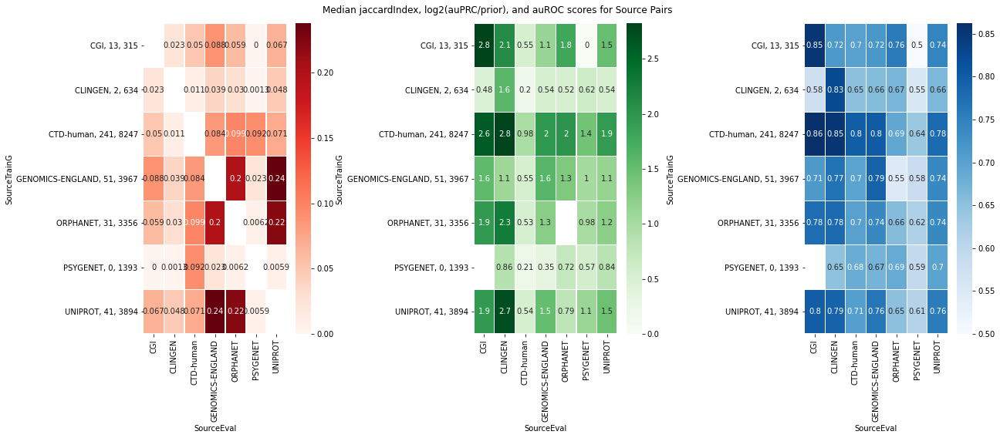

In [24]:
resultJaccard2 = df3.pivot("SourceTrainG", "SourceEval", "medianJaccard")
resultLog2 = merge1.pivot("SourceTrainG", "SourceEval", "Medianlog")
resultauROC2 = merge1.pivot("SourceTrainG", "SourceEval", "medianauROC")
plt.rcParams["figure.figsize"] = [18,8]
fig, axes = plt.subplots(1, 3)
#fig, ax = plt.subplots(figsize=(8,6))   
sns.heatmap(resultJaccard2, annot = True, linewidths = .25, ax=axes[0], cmap = 'Reds')
#plt.xlabel("labels on x axis")
sns.heatmap(resultLog2, annot = True, linewidths = .25, ax=axes[1], cmap = 'Greens')
sns.heatmap(resultauROC2, annot = True, linewidths = .25, ax=axes[2], cmap = 'Blues')

plt.suptitle(t = 'Median jaccardIndex, log2(auPRC/prior), and auROC scores for Source Pairs')

plt.tight_layout()
plt.show()

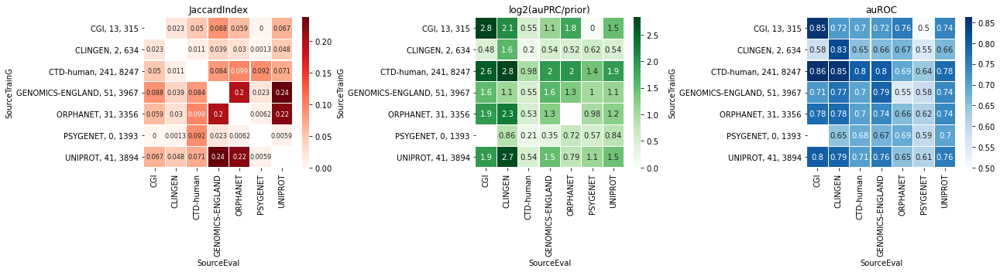

In [25]:
resultJaccard2 = df3.pivot("SourceTrainG", "SourceEval", "medianJaccard")
resultLog2 = merge1.pivot("SourceTrainG", "SourceEval", "Medianlog")
resultauROC2 = merge1.pivot("SourceTrainG", "SourceEval", "medianauROC")
plt.rcParams["figure.figsize"] = [18,5]

f,(ax1,ax2,ax3) = plt.subplots(1,3) 
g1 = sns.heatmap(resultJaccard2, annot = True, linewidths = .25, cmap = 'Reds', ax = ax1, annot_kws={"size": 8})
#g1.set_ylabel('')
#g1.set_xlabel('')
g1.set_title('JaccardIndex')
g2 = sns.heatmap(resultLog2, annot = True, linewidths = .25, cmap = 'Greens', ax = ax2)
#g2.set_ylabel('')
#g2.set_xlabel('')
#g2.set_yticks([])
g2.set_title('log2(auPRC/prior)')
g3 = sns.heatmap(resultauROC2, annot = True, linewidths = .25, cmap = 'Blues', ax = ax3)
#g3.set_ylabel('')
#g3.set_xlabel('')
#g3.set_yticks([])
g3.set_title('auROC')

plt.tight_layout()
plt.show()

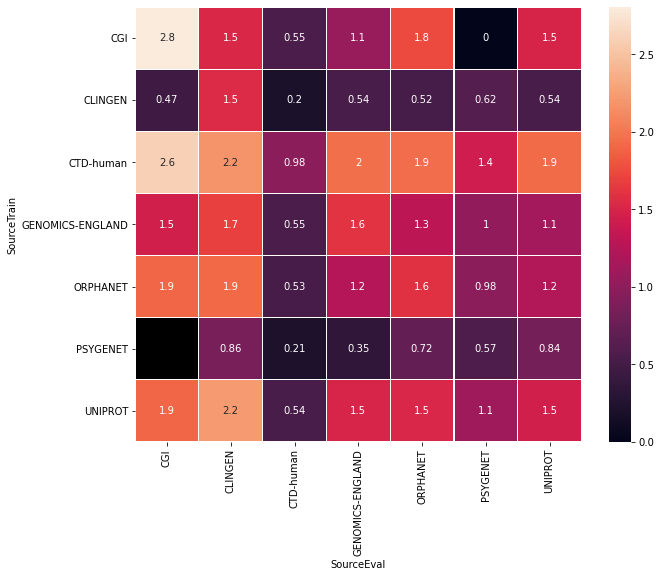

In [97]:
df3 = df2.pivot("SourceTrain", "SourceEval", "Median")
fig, ax = plt.subplots(figsize=(10,8))   
ax = sns.heatmap(df3, annot = True, linewidths = .25)
ax.set_facecolor('xkcd:black')